<a href="https://colab.research.google.com/github/gemorenov42/Airbnb-Buenos-Aires/blob/main/Microproyecto_1_Aprendizaje_No_Supervisado_(Medina_Angie_Moreno_Gabriel)_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Generación de paleta de colores a partir de imágenes con técnicas de Machine Learning no Supervisado**

Realizado por:

***Angie Stefany Medina***

***Gabriel Eduardo Moreno***

Una paleta de colores es un conjunto de tonos que se utilizan juntos para crear un efecto armonioso, coherente y atractivo en las representaciones visuales (diseño gráfico, cine, fotografía, pintura, etc.), así como para transmitir mensajes y generar emociones determinados, de acuerdo con la intencionalidad del autor de la obra.


En un contexto de amplia demanda de herramientas que puedan asistir a diseñadores gráficos, directores de arte, pintores y creadores de contenido, entre otros, para la selección rápida y adecuada de los colores apropiados para sus obras, una aplicación para configurar paletas de colores a partir de imágenes sería de mucha utilidad.


El problema central radica en **desarrollar un método automatizado que pueda generar una paleta coherente y estéticamente atractiva partiendo de los colores identificados en una imagen**. Esto implica no solo reconocer tonos dominantes, sino también comprender la relación existente al interior de la gama cromática empleada para crear combinaciones visuales agradables y funcionales. Abordar este problema se traduciría en varias ventajas:


-Eficiencia en el proceso creativo, al liberar tiempo que los autores podrían emplear en otros aspectos estratégicos de sus proyectos.


-Consistencia interna en los diseños, manteniendo una identidad visual constante en diferentes aplicaciones y proyectos.


-Facilidad de uso y recurso de aprendizaje para personas con menos experiencia en diseño, fomentando la creatividad en diversos campos.


-Optimización de la calidad y del impacto de la comunicación visual.


Una vía para lograr una herramienta como esta es utilizar técnicas de machine learning no supervisado sobre imágenes para visualizar la distribución de los colores dominantes presentes en estas y generar, de manera automática, modelos de paletas de colores. En esta primera aproximación el método va a permitir identificar los colores dominantes en una imagen para construir un muestrario por similitud de píxeles, lo cual puede ser muy útil para estudios de marketing, psicología, medicina, arte, ambiente, entre otros. Por ejemplo, se podrían extraer los colores de las diferentes superficies de la Tierra en una imagen satelital para estudiar la distribución de la vegetación o de la contaminación.


**A. Objetivo.**

Desarrollar un método, basado en técnicas de agrupación, que permita extraer los tonos dominantes de una imagen y generar un muestrario de los colores representativos presentes en esta.


**B. Conjunto de datos.**


Los datos están asociados con imágenes de obras de arte. Pueden ser descargados a partir de este enlace.



In [1]:
# Instalación de dependencias si es necesario
!pip install kagglehub matplotlib seaborn scikit-learn pillow numpy
!pip install -q kagglehub scikit-learn-extra scikit-fuzzy

import os
import glob
import kagglehub
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from sklearn.metrics import silhouette_score, mean_squared_error
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, MeanShift, SpectralClustering, estimate_bandwidth, MiniBatchKMeans
from sklearn_extra.cluster import KMedoids
import warnings
import skfuzzy as fuzz
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from sklearn.neural_network import MLPRegressor
import warnings
import random
from PIL import Image
warnings.filterwarnings('ignore')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.0/819.0 kB 14.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 920.8/920.8 kB 45.3 MB/s eta 0:00:00


**C. Actividades para realizar.**

**1. Recopilación de las imágenes a partir del repositorio. La idea es seleccionar un conjunto diverso de muestras en diferentes estilos artísticos (varios pintores). Se recomienda seleccionar entre 6 y 10 imágenes.**



Using Colab cache for faster access to the 'wikiart' dataset.
Ruta del dataset: /kaggle/input/wikiart
Imágenes seleccionadas fijas: 8


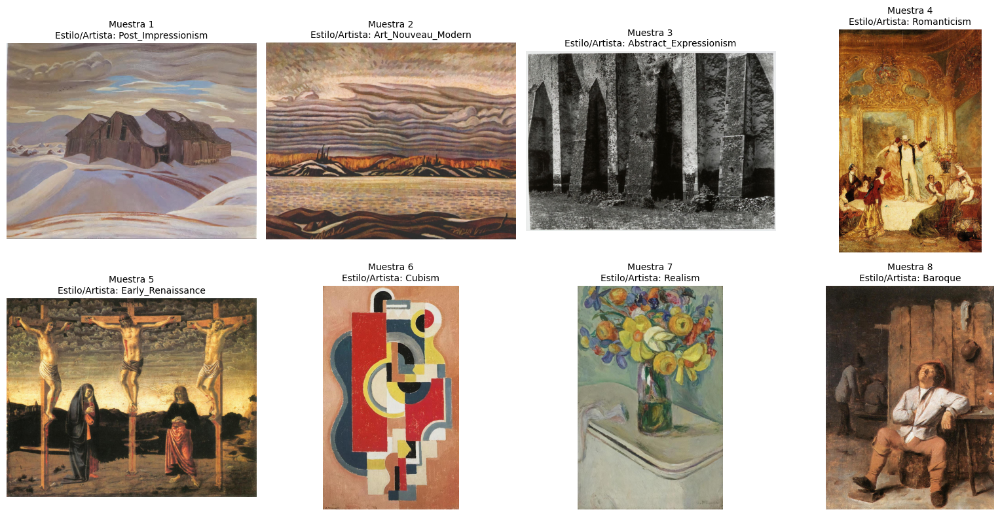

In [2]:

# se descarga el dataset 'wikiart' desde Kaggle
path = kagglehub.dataset_download("steubk/wikiart")

# se imprimir en la consola la ruta local donde se almacenaron los archivos del dataset
print("Ruta del dataset:", path)

# se establece la semilla del generador aleatorio para garantizar que siempre se elijan las mismas imágenes
random.seed(42)


# se escanea el directorio principal y obtiene únicamente las subcarpetas válidas (artistas/estilos), omitiendo carpetas ocultas
subcarpetas = [
    f.path for f in os.scandir(path) if f.is_dir() and not f.name.startswith(".")
]

# se crea una  lista vacía para almacenar las rutas finales de las imágenes seleccionadas
selected_images_paths = []

# se evalúa si se encontraron subcarpetas dentro del dataset para proceder a la selección por carpeta
if subcarpetas:
    # se ordena alfabéticamente la lista de carpetas
    subcarpetas.sort()

    # se selecciona aleatoriamente 8 carpetas distintas utilizando la semilla fijada
    carpetas_seleccionadas = random.sample(
        subcarpetas, min(8, len(subcarpetas))
    )

    # Inicia un for loop que recorre cada una de las 8 carpetas seleccionadas
    for carpeta in carpetas_seleccionadas:
        # Busca archivos '.jpg', '.jpeg' y '.png' exclusivamente dentro de la carpeta actual
        imgs = (
            glob.glob(os.path.join(carpeta, "*.jpg"))
            + glob.glob(os.path.join(carpeta, "*.jpeg"))
            + glob.glob(os.path.join(carpeta, "*.png"))
        )

        # se verifica si se encontraron imágenes en la carpeta evaluada
        if imgs:
            # Ordena las rutas de las imágenes encontradas de forma alfabética para asegurar consistencia
            imgs.sort()

            # se añade la primera imagen de la carpeta ordenada a la lista definitiva de selección
            selected_images_paths.append(imgs[0])

# Comprueba si la lista aún no alcanza las 8 imágenes requeridas
if len(selected_images_paths) < 8:
    # Define con las extensiones de archivos de imagen permitidas
    image_extensions = ("*.jpg", "*.jpeg", "*.png")

    # se inicia una lista vacía para guardar todas las imágenes
    all_images = []

    # Recorre cada extensión definida para buscar archivos
    for ext in image_extensions:
        # se agrega a la lista todas las imágenes halladas
        all_images.extend(
            glob.glob(os.path.join(path, "**", ext), recursive=True)
        )

    # se ordena la lista completa de imágenes alfabéticamente
    all_images.sort()

    # se reinicia la semilla aleatoria para mantener coherencia en la selección
    random.seed(42)

    # se seleccionan 8 imágenes aleatorias de la lista global
    selected_images_paths = random.sample(all_images, min(8, len(all_images)))

# Muestra la cantidad de imagenes que se van a imprimir
print(f"Imágenes seleccionadas fijas: {len(selected_images_paths)}")

# Crea una cuadrícula  de 2 filas por 4 columnas con un tamaño de 16x8 pulgadas
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Aplana el arreglo bidimensional de ejes para convertirlo en una lista simple de 8 elementos
axes = axes.flatten()

# Inicia un ciclo for que itera 8 veces
for i in range(8):
    # Comprueba si el índice actual es menor que la cantidad de imágenes disponibles en la lista
    if i < len(selected_images_paths):
        # Obtiene la ruta del archivo de imagen correspondiente al índice 'i'
        img_path = selected_images_paths[i]

        # Abre el archivo de imagen utilizando la librería Pillow
        img = Image.open(img_path)

        # Extrae el nombre del directorio contenedor para identificar el artista o estilo de la obra
        nombre_artista = os.path.basename(os.path.dirname(img_path))

        # Incluye la imagen actual dentro del cuadrante correspondiente
        axes[i].imshow(img)

        # Coloca un título mostrando el número de muestra y el artista y o el estilo
        axes[i].set_title(
            f"Muestra {i+1}\nEstilo/Artista: {nombre_artista}", fontsize=10
        )

        # Oculta los ejes X e Y para lograr una vista más limpia de la obra
        axes[i].axis("off")
    else:
        # Si no hay imagen disponible para esa celda, desactiva y oculta el cuadro del gráfico sobrante
        axes[i].axis("off")

# Se ajusta el espaciado entre los subgráficos para evitar superposiciones de texto o imágenes
plt.tight_layout()

# Muestra la figura final
plt.show()

Para el primer punto, que es la  etapa de recopilación y selección de datos, se extrae una muestra representativa de obras de arte del repositorio WikiArt buscando garantizar variedad estilística y estética. Para optimizar el tiempo de ejecución, detecta las subcarpetas de los diferentes artistas o movimientos artísticos, las ordena alfabéticamente y fija una semilla aleatoria (random.seed(42)).

De este modo, se seleccionan 8 imágenes de distintas categorías, garantizando que el conjunto de prueba sea idéntico en cada ejecución. Finalmente, cada muestra se carga en su formato nativo utilizando la librería Pillow y se visualiza en una grilla de $2 \times 4$ mediante Matplotlib, etiquetando el artista o estilo correspondiente para verificar la diversidad cromática del grupo de imágenes previo al preprocesamiento.

**2. Preparación de las imágenes para el entrenamiento y prueba del modelo. Para este paso construir un pipeline que integre las transformaciones que se consideren adecuadas.**



In [3]:
def image_preprocessing_pipeline(image_path, target_size=(150, 150), keep_aspect_ratio=True, downsample_factor=2, verbose=True, plot_steps=True): # Define la función principal del pipeline de preprocesamiento de imágenes.
    """
    Pipeline de preprocesamiento de imágenes para extracción de paletas de color.
    Incluye reportes en texto e impresión gráfica visual de cada transformación.
    """

    # --------------------------------------------------------------------------------
    # PASO 1: CARGA DE LA IMAGEN Y CONVERSIÓN INICIAL A RGB
    # --------------------------------------------------------------------------------
    # Abre la imagen original desde el disco usando Pillow
    img_original = Image.open(image_path)                                       # Carga el archivo de imagen desde la ruta especificada.

    # Convierte la imagen al modo RGB para eliminar canales adicionales (como Alpha/Transparencia) # Comentario sobre la conversión a RGB.
    img_rgb = img_original.convert('RGB')                                       # Convierte el formato de color a RGB estándar descartando canales extras.

    # --------------------------------------------------------------------------------
    # PASO 2: REDIMENSIONAMIENTO (AJUSTE DE RESOLUCIÓN CON PADDING OPCIONAL)
    # --------------------------------------------------------------------------------
    if keep_aspect_ratio:                                                       # Condicional que verifica si se debe mantener la relación de aspecto original.
        # Crea una copia de la imagen usando thumbnail para preservar la relación de aspecto # Comentario sobre el uso de thumbnail.
        img_resized = img_rgb.copy()                                            # Copia la imagen RGB original.
        img_resized.thumbnail(target_size, Image.Resampling.LANCZOS)            # Redimensiona la copia preservando la proporción usando el filtro de alta calidad Lanczos.

        # Crea un lienzo de color neutro (gris) del tamaño objetivo deseado
        canvas = Image.new("RGB", target_size, (128, 128, 128))                  # Crea una nueva imagen de fondo gris medio con las dimensiones objetivo.

        # Calcula la posición centrada para pegar la imagen dentro del lienzo
        paste_x = (target_size[0] - img_resized.width) // 2                     # Calcula la coordenada horizontal de pegado para centrar la imagen.
        paste_y = (target_size[1] - img_resized.height) // 2                    # Calcula la coordenada vertical de pegado para centrar la imagen.

        # Pega la imagen ajustada en el centro del lienzo
        canvas.paste(img_resized, (paste_x, paste_y))                           # Pega la imagen redimensionada exactamente en el centro del lienzo gris.
        img_processed = canvas                                                  # Asigna la imagen final procesada con padding a la variable respectiva.
    else:                                                                       # En caso de no requerir mantener la proporción:
        # Realiza un redimensionamiento directo a la forma exacta de target_size   # Comentario sobre el reescalado estricto.
        img_processed = img_rgb.resize(target_size, Image.Resampling.LANCZOS)   # Redimensiona la imagen de manera forzada a las dimensiones exactas objetivo.

    # --------------------------------------------------------------------------------
    # PASO 3: CONVERSIÓN A MATRIZ NUMPY Y NORMALIZACIÓN DE VALORES
    # --------------------------------------------------------------------------------
    # Convierte la imagen procesada de PIL a un arreglo tridimensional de NumPy
    img_array = np.array(img_processed, dtype=np.float32)                       # Transforma la imagen PIL en un arreglo numérico 3D con tipo de datos de punto flotante.

    # Normaliza los valores de píxeles dividiendo entre 255.0 para llevar la escala al rango [0.0, 1.0] # Comentario sobre la normalización.
    img_normalized = img_array / 255.0                                          # Divide todos los valores de los canales de color entre 255 para normalizarlos entre 0 y 1.

    # --------------------------------------------------------------------------------
    # PASO 4: APLANADO Y SUBMUESTREO (DOWNSAMPLING) DE PÍXELES
    # --------------------------------------------------------------------------------
    # Aplana la matriz 3D (Alto, Ancho, 3) a una matriz 2D de píxeles (N, 3)
    pixels_all = img_normalized.reshape(-1, 3)                                  # Cambia la forma del arreglo tridimensional a una matriz bidimensional de píxeles y sus 3 canales RGB.

    # Aplica el submuestreo tomando 1 de cada 'downsample_factor' píxeles
    pixels_subsampled = pixels_all[::downsample_factor]                         # Se reduce el número de píxeles aplicando un paso (step) según el factor de submuestreo definido.

    # Imprime el registro de texto explicativo
    if verbose:                                                                 # Se establece condicional para imprimir los reportes por consola si verbose es True.
        print("\n" + "="*65)
        print(f"  EJECUTANDO PIPELINE DE PREPROCESAMIENTO: {image_path}")       # Imprime el mensaje informando la ruta de la imagen procesada.
        print("="*65)
        print(f"[PASO 1] Imagen Original: {img_original.size} (WxH) | Modo: {img_original.mode}") # Imprime detalles de la imagen original.
        print(f"[PASO 2] Redimensionada + Padding: {img_processed.size} (WxH)")   # Imprime detalles de la imagen tras redimensionar y aplicar padding.
        print(f"[PASO 3] Normalizada NumPy: Forma {img_normalized.shape} | Rango [{img_normalized.min():.2f}, {img_normalized.max():.2f}]") # Imprime la forma y rango numérico normalizado.
        print(f"[PASO 4] Matriz Aplanada 2D: {pixels_all.shape}")                 # Imprime la forma de la matriz bidimensional total de píxeles.
        print(f"[PASO 5] Píxeles finales para ML (Factor {downsample_factor}): {pixels_subsampled.shape}") # Imprime la forma resultante de los píxeles listos para el Machine Learning.
        print("="*65 + "\n")

    # --------------------------------------------------------------------------------
    # IMPRESIÓN VISUAL: GENERACIÓN DE FIGURA CON LOS PASOS EN IMÁGENES
    # --------------------------------------------------------------------------------
    if plot_steps:                                                              # Se establece condicional
                                                                                 # Crea una figura con 1 fila y 4 columnas de subgráficos para mostrar la evolución visual
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))                         # Crea una cuadrícula horizontal de 4 subgráficos con tamaño específico.

        # Muestra la imagen original
        axes[0].imshow(img_original)                                            # Se dibuja la imagen original en el primer panel.
        axes[0].set_title(f"Paso 1: Original\nRes: {img_original.size[0]}x{img_original.size[1]}", fontsize=11) # Asigna título con la resolución original.
        axes[0].axis('off')                                                     # Oculta los ejes numéricos del gráfico.

        # Muestra la imagen redimensionada
        axes[1].imshow(img_processed)                                           # se  dibuja la imagen procesada con redimensionamiento y padding.
        axes[1].set_title(f"Paso 2: Redimensionada + Padding\nRes: {target_size[0]}x{target_size[1]}", fontsize=11) # se asigna título con las dimensiones objetivo.
        axes[1].axis('off')                                                     # Oculta los ejes numéricos.

        # Muestra la matriz normalizada en NumPy
        axes[2].imshow(img_normalized)                                          # se dibuja la imagen normalizada basada en los valores en coma flotante.
        axes[2].set_title(f"Paso 3: Matriz Normalizada [0.0, 1.0]\nShape: {img_normalized.shape}", fontsize=11) # Asigna título con la forma de la matriz.
        axes[2].axis('off')                                                     #  se oculta los ejes numéricos.

        # Muestra la dispersión de píxeles (Rojo vs Verde) coloreada con su tono real
        sample_pixels = pixels_subsampled[::10] # se toma una muestra aún más reducida de píxeles para optimizar el rendimiento del gráfico de dispersión.
        axes[3].scatter(sample_pixels[:, 0], sample_pixels[:, 1], c=sample_pixels, s=5, alpha=0.6) # se dibuja un diagrama de dispersión enfrentando el canal rojo y verde con sus colores reales.
        axes[3].set_title(f"Paso 4: Espacio de Píxeles (R vs G)\nDatos para ML: {pixels_subsampled.shape[0]}", fontsize=11) # se asigna el título
        axes[3].set_xlabel("Canal Rojo (R)")                                    # Etiqueta el eje X como el Canal Rojo.
        axes[3].set_ylabel("Canal Verde (G)")                                   # Etiqueta el eje Y como el Canal Verde.
        axes[3].set_xlim(0, 1)                                                  # Establece los límites del eje X entre 0 y 1.
        axes[3].set_ylim(0, 1)                                                  # Establece los límites del eje Y entre 0 y 1.

        # Ajusta el espaciado para evitar superposición
        plt.tight_layout()

        # Gráfica completa en pantalla
        plt.show()


    return {                                                                    # Retorna un diccionario con todos los elementos generados necesarios para las fases posteriores.
        "img_original": img_original,                                           # Guarda la referencia a la imagen PIL original.
        "img_processed": img_processed,                                         # Guarda la referencia a la imagen procesada (con padding o redimensionada).
        "img_array": img_normalized,                                            # Guarda la matriz tridimensional normalizada.
        "pixels": pixels_subsampled                                             # Guarda la matriz bidimensional submuestreada de píxeles lista para los modelos de ML.
    }

print("Pipeline visual de preprocesamiento redefinido con éxito.")               # imprimir cuando finalice.

Pipeline visual de preprocesamiento redefinido con éxito.


Se aplica el pipeline en la primera pintura para observar el paso a paso de las transformaciones:


  EJECUTANDO PIPELINE DE PREPROCESAMIENTO: /kaggle/input/wikiart/Post_Impressionism/a.y.-jackson_barns-1926.jpg
[PASO 1] Imagen Original: (1759, 1382) (WxH) | Modo: RGB
[PASO 2] Redimensionada + Padding: (150, 150) (WxH)
[PASO 3] Normalizada NumPy: Forma (150, 150, 3) | Rango [0.16, 0.88]
[PASO 4] Matriz Aplanada 2D: (22500, 3)
[PASO 5] Píxeles finales para ML (Factor 2): (11250, 3)



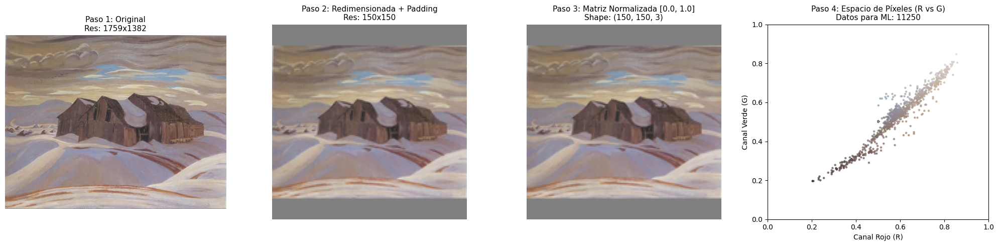

In [4]:
# Ejecutamos el pipeline de prueba sobre la primera imagen
resultado = image_preprocessing_pipeline(
    image_path=selected_images_paths[0],
    target_size=(150, 150),
    keep_aspect_ratio=True,
    downsample_factor=2,
    verbose=True,
    plot_steps=True)

En el segundo punto, se ejecuta un pipeline de preprocesamiento diseñado para preparar los datos de la imagen sin distorsionar su información cromática, se toma la primera pintura como ejemplo de lo que se hará sobre el total.

En primer lugar, la obra original (de 1759×1382 píxeles) se redimensiona a 150×150 utilizando padding, tambien llamado Relleno Neutro el cual, a diferencia del estilo Crop o Recorte, que elimina áreas bordes de la composición, o el Resize directo, que deforma las proporciones; conserva intacta la geometría y distribución de tonos original de la obra.


Después, la imagen se transforma en matriz NumPy y se normaliza al rango [0.0, 1.0], lo que  es fundamental porque los algoritmos de clustering (como $K$-Means o Fuzzy $C$-Means) se basan en distancias euclídeas en el espacio ed, Green, Blue (Rojo, Verde y Azul) $RGB$; esto significa que,  al estandarizar los valores numéricos, se evita que canales con mayor varianza dominen el cálculo y se asegura una convergencia óptima, es decir, para facilitar las agrupaciones en los siguientes pasos.


Por último, tras aplanar la matriz (150 x 150= 22500 datos de 3 dimensiones), se aplica un submuestreo (downsampling de factor 2, tomando 1 de cada 2 píxeles de forma intercalada) para reducir la muestra a 11250 observaciones. Con estos pasos se espera optimizar la complejidad computacional y mejorar el tiempo de entrenamiento de los modelos sin perder la representatividad cromática requerida para extraer la paleta final.

## **3. Desarrollo del modelo de agrupación para identificar los colores dominantes en una imagen.**

Para el desarrollo del Punto 3, se implementó un enfoque comparativo utilizando los vectores de píxeles preprocesados ($RGB \in [0.0, 1.0]^3$) del pipeline previo. Se evaluaron de manera automatizada seis algoritmos de agrupación: **K-Means, K-Medoids, Fuzzy C-Means, Spectral Clustering, Mean-Shift y una aproximación híbrida de Red Neuronal Difusa (Fuzzy Neural Network), la cual combina la lógica difusa para mapear probabilidades de membresía con un Perceptrón Multicapa (MLP) para optimizar la reconstrucción**. Los métodos de partición se configuraron para extraer $k=5$ clústeres, mientras que los enfoques basados en densidad determinaron los tonos de forma orgánica, extrayendo las paletas representativas para cuantizar y reconstruir la imagen.


Los modelos implementados abordan la cuantización de color desde diferentes perspectivas matemáticas: K-Means minimiza la inercia calculando la distancia euclidiana al cuadrado respecto a centroides medios; K-Medoids optimiza agrupamientos utilizando puntos reales (medoides) mediante distancias para mayor robustez frente al ruido; Fuzzy C-Means (FCM) introduce membresías difusas $u_{ij} \in [0,1]$ minimizando una función de costo ponderada por el parámetro de borrosidad $m$; Spectral Clustering proyecta los datos a un espacio espectral mediante la matriz Laplaciana de un grafo de afinidad; Mean Shift desplaza iterativamente los puntos hacia las regiones de mayor densidad utilizando un núcleo (kernel) y un ancho de banda $h$; y la Red Neuronal Difusa (FNN) acopla las membresías de FCM a un Perceptrón Multicapa (MLP) para aprender un mapeo no lineal que minimiza el error en los pesos.


Para comparar modelos de naturalezas tan variadas (rígidos, difusos, de grafos e híbridos neuronales), se adoptó, en esta primera parte, un marco de evaluación unificado mediante el Coeficiente de Silueta, que cuantifica la compacidad y separación de los grupos de color, y el Error Cuadrático Medio (MSE), que mide la pérdida de fidelidad en la reconstrucción frente a la obra original. Esta evaluación se acompaña de un panel gráfico que contrasta la fotografía original con las reconstrucciones espaciales de cada algoritmo.Esta estrategia analítica se fundamenta en la literatura reciente de procesamiento de color y modelos de agrupación.


 Por un lado, trabajos como los de Su et al. (2021) y Vlašič y Špiclin (2023) respaldan el uso del MSE y métricas de distancia sobre espacios vectorizados para comparar variantes de K-Means, modelos difusos y de grafos. Por otro lado, conforme a Rousseeuw (1987), el Coeficiente de Silueta provee una validación intrínseca e independiente de la arquitectura interna de los algoritmos, lo que valida su uso transversal en la selección del modelo óptimo.

 Para comparar todos los modelos de manera estandarizada e independiente de sus criterios internos, se reconstruye la imagen completa y se aplican dos indicadores universales de fidelidad: el Error Cuadrático Medio (MSE), definido matemáticamente como $MSE = \frac{1}{N}\sum_{i=1}^{N} (x_i - \hat{x}_i)^2$, el cual penaliza exponencialmente los errores drásticos de color para identificar el modelo con menor degradación. Estos valores se tienen en cuenta junto con las métricas para escoger el modelo adecuado para cada pintura de la siguiente forma:


 PUNTO 3: EVALUACIÓN Y RECONSTRUCCIÓN (MODELO GANADOR POR PINTURA)

[TABLA DE RESULTADOS - PINTURA 1/8] a.y.-jackson_barns-1926.jpg
-------------------------------------------------------------------------------------
MODELO DE AGRUPACIÓN      | SILUETA (HOMOGÉNEA)  | ERROR CUADRÁTICO MEDIO (MSE)
-------------------------------------------------------------------------------------
K-Means                   |        0.4730        |           0.001533          
K-Medoids                 |        0.4482        |           0.001833          
Fuzzy-C-Means             |        0.4692        |           0.001608          
Spectral-Graph            |        0.3249        |           0.002167          
Mean-Shift                |        0.4413        |           0.001992          
Fuzzy-Neuronal            |        0.4692        |           0.001608          
-------------------------------------------------------------------------------------
  --> MODELO GANADOR GLOBAL (SELECCIONADO POR MENO

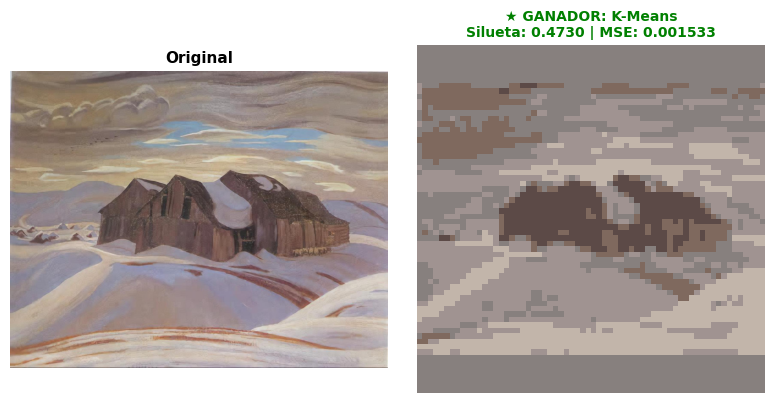


[TABLA DE RESULTADOS - PINTURA 2/8] a.y.-jackson_algoma-in-november-1935.jpg
-------------------------------------------------------------------------------------
MODELO DE AGRUPACIÓN      | SILUETA (HOMOGÉNEA)  | ERROR CUADRÁTICO MEDIO (MSE)
-------------------------------------------------------------------------------------
K-Means                   |        0.5250        |           0.002214          
K-Medoids                 |        0.5065        |           0.002645          
Fuzzy-C-Means             |        0.5304        |           0.002248          
Spectral-Graph            |        0.3697        |           0.002421          
Mean-Shift                |        0.4998        |           0.005523          
Fuzzy-Neuronal            |        0.5304        |           0.002248          
-------------------------------------------------------------------------------------
  --> MODELO GANADOR GLOBAL (SELECCIONADO POR MENOR ECM/MSE): K-Means
----------------------------------

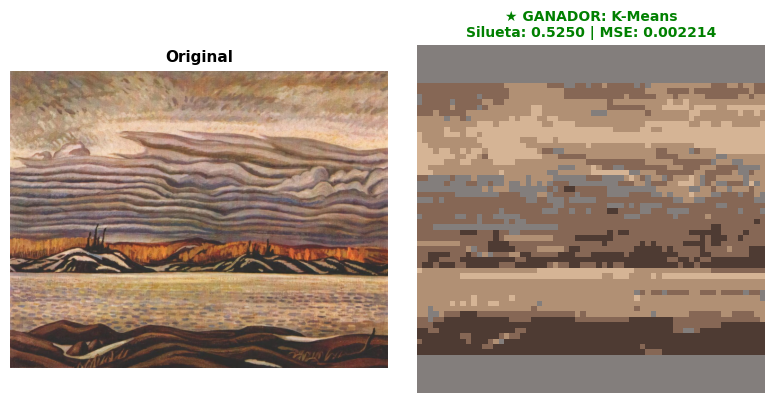


[TABLA DE RESULTADOS - PINTURA 3/8] aaron-siskind_acolman-1-1955.jpg
-------------------------------------------------------------------------------------
MODELO DE AGRUPACIÓN      | SILUETA (HOMOGÉNEA)  | ERROR CUADRÁTICO MEDIO (MSE)
-------------------------------------------------------------------------------------
K-Means                   |        0.6692        |           0.001478          
K-Medoids                 |        0.6698        |           0.001524          
Fuzzy-C-Means             |        0.6694        |           0.001487          
Spectral-Graph            |        0.4955        |           0.001682          
Mean-Shift                |        0.6502        |           0.001949          
Fuzzy-Neuronal            |        0.6694        |           0.001487          
-------------------------------------------------------------------------------------
  --> MODELO GANADOR GLOBAL (SELECCIONADO POR MENOR ECM/MSE): K-Means
------------------------------------------

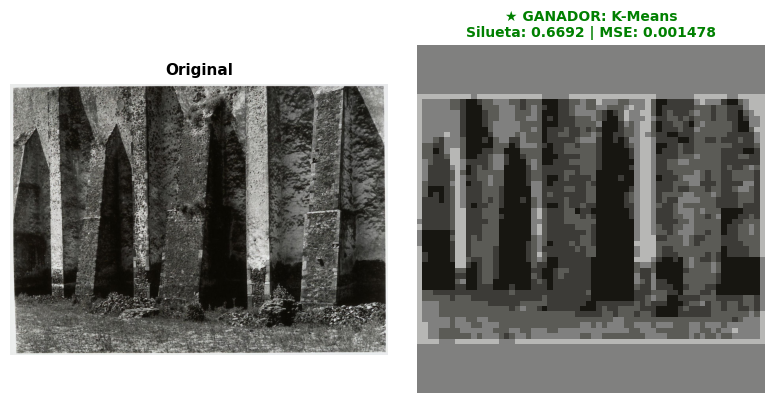


[TABLA DE RESULTADOS - PINTURA 4/8] adolphe-joseph-thomas-monticelli_an-evening-at-the-paiva.jpg
-------------------------------------------------------------------------------------
MODELO DE AGRUPACIÓN      | SILUETA (HOMOGÉNEA)  | ERROR CUADRÁTICO MEDIO (MSE)
-------------------------------------------------------------------------------------
K-Means                   |        0.6620        |           0.002425          
K-Medoids                 |        0.6258        |           0.002863          
Fuzzy-C-Means             |        0.6510        |           0.002451          
Spectral-Graph            |        0.5615        |           0.002776          
Mean-Shift                |        0.6576        |           0.005202          
Fuzzy-Neuronal            |        0.6510        |           0.002451          
-------------------------------------------------------------------------------------
  --> MODELO GANADOR GLOBAL (SELECCIONADO POR MENOR ECM/MSE): K-Means
--------------

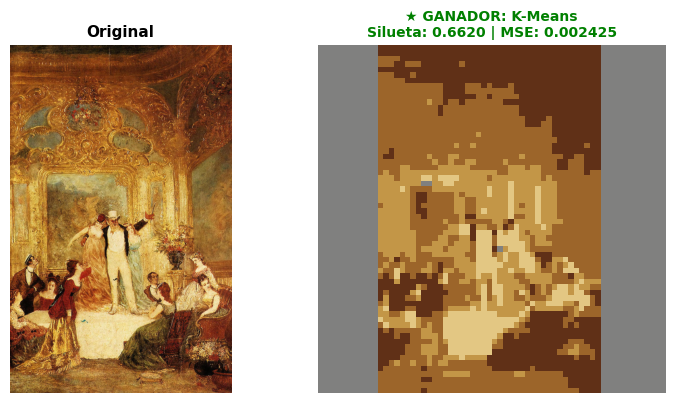


[TABLA DE RESULTADOS - PINTURA 5/8] andrea-del-castagno_crucifixion-1.jpg
-------------------------------------------------------------------------------------
MODELO DE AGRUPACIÓN      | SILUETA (HOMOGÉNEA)  | ERROR CUADRÁTICO MEDIO (MSE)
-------------------------------------------------------------------------------------
K-Means                   |        0.5855        |           0.003375          
K-Medoids                 |        0.5658        |           0.003626          
Fuzzy-C-Means             |        0.5752        |           0.003517          
Spectral-Graph            |        0.4717        |           0.004333          
Mean-Shift                |        0.5331        |           0.003530          
Fuzzy-Neuronal            |        0.5752        |           0.003517          
-------------------------------------------------------------------------------------
  --> MODELO GANADOR GLOBAL (SELECCIONADO POR MENOR ECM/MSE): K-Means
-------------------------------------

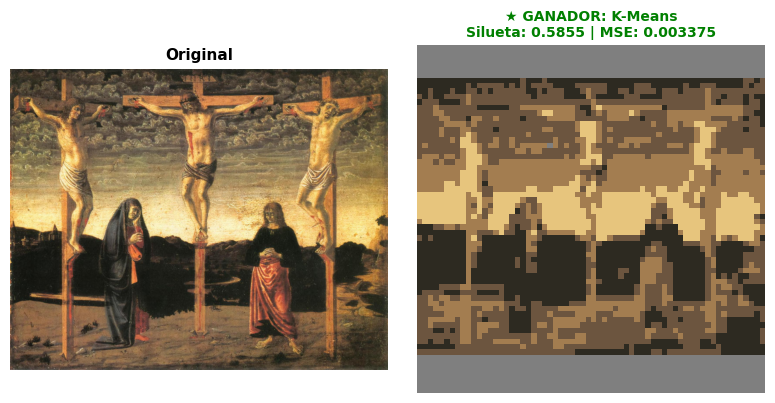


[TABLA DE RESULTADOS - PINTURA 6/8] adolf-fleischmann_hommage-delaunay-et-gleizes-1938.jpg
-------------------------------------------------------------------------------------
MODELO DE AGRUPACIÓN      | SILUETA (HOMOGÉNEA)  | ERROR CUADRÁTICO MEDIO (MSE)
-------------------------------------------------------------------------------------
K-Means                   |        0.6693        |           0.003350          
K-Medoids                 |        0.6735        |           0.003477          
Fuzzy-C-Means             |        0.6713        |           0.003392          
Spectral-Graph            |        0.6507        |           0.003509          
Mean-Shift                |        0.6461        |           0.002471          
Fuzzy-Neuronal            |        0.6713        |           0.003392          
-------------------------------------------------------------------------------------
  --> MODELO GANADOR GLOBAL (SELECCIONADO POR MENOR ECM/MSE): Mean-Shift
-----------------

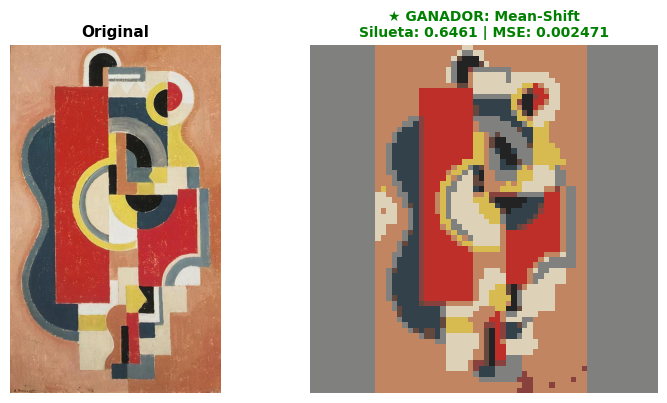


[TABLA DE RESULTADOS - PINTURA 7/8] abraham-manievich_flowers-vase-on-a-hamper.jpg
-------------------------------------------------------------------------------------
MODELO DE AGRUPACIÓN      | SILUETA (HOMOGÉNEA)  | ERROR CUADRÁTICO MEDIO (MSE)
-------------------------------------------------------------------------------------
K-Means                   |        0.5660        |           0.001931          
K-Medoids                 |        0.5675        |           0.002021          
Fuzzy-C-Means             |        0.5613        |           0.001956          
Spectral-Graph            |        0.5376        |           0.002471          
Mean-Shift                |        0.5555        |           0.002155          
Fuzzy-Neuronal            |        0.5613        |           0.001956          
-------------------------------------------------------------------------------------
  --> MODELO GANADOR GLOBAL (SELECCIONADO POR MENOR ECM/MSE): K-Means
----------------------------

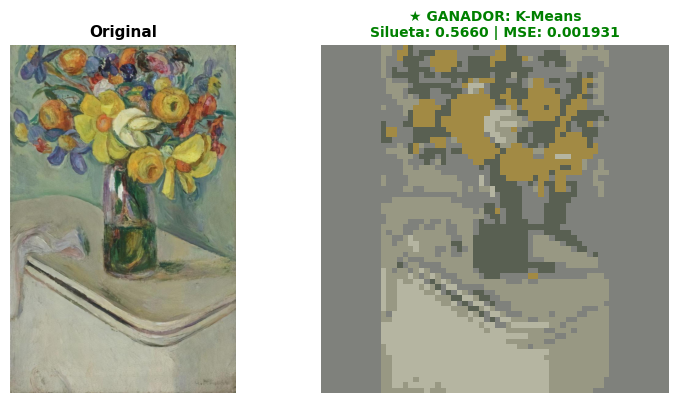


[TABLA DE RESULTADOS - PINTURA 8/8] adriaen-brouwer_a-boor-asleep.jpg
-------------------------------------------------------------------------------------
MODELO DE AGRUPACIÓN      | SILUETA (HOMOGÉNEA)  | ERROR CUADRÁTICO MEDIO (MSE)
-------------------------------------------------------------------------------------
K-Means                   |        0.6022        |           0.002484          
K-Medoids                 |        0.6102        |           0.002785          
Fuzzy-C-Means             |        0.5840        |           0.002580          
Spectral-Graph            |        0.5714        |           0.002898          
Mean-Shift                |        0.6127        |           0.001848          
Fuzzy-Neuronal            |        0.5840        |           0.002580          
-------------------------------------------------------------------------------------
  --> MODELO GANADOR GLOBAL (SELECCIONADO POR MENOR ECM/MSE): Mean-Shift
--------------------------------------

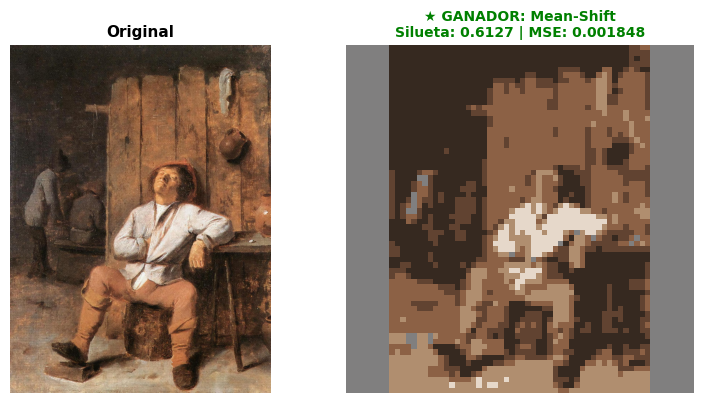

In [6]:
# =====================================================================================
# Punto 3
# =====================================================================================
# =====================================================================================
# CLASE DEFINIDA POR EL USUARIO (INALTERADA)
# =====================================================================================
class FuzzyNeuralColorQuantizer:                                                # Se construye una función basada en Redes Neuronales y C-Means Difuso.
    def __init__(self, n_clusters=5, random_state=42):                          # Se define la clase que recibe el número de clústeres y una semilla aleatoria.
        self.n_clusters = n_clusters                                            # se almacena el número de clústeres como atributo de la clase.
        self.mlp = MLPRegressor(hidden_layer_sizes=(16, 8), max_iter=300, random_state=random_state) # Se realiza un regresor de red neuronal perceptrón multicapa con 2 capas ocultas (16 y 8 neuronas).
        self.cluster_centers_ = None                                            # Se define un atributo inicial nulo para guardar los centroides calculados.
        self.labels_ = None                                                     # Se define un atributo inicial nulo para guardar las etiquetas asignadas a cada píxel.

    def fit(self, X):                                                           # Se define el método de entrenamiento (fit) de la red neuronal difusa usando los datos de píxeles X.
        cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(                           # se ejecuta el algoritmo Fuzzy C-Means sobre la transpuesta de X para obtener centroides y membresías.
            X.T, c=self.n_clusters, m=2.0, error=0.01, maxiter=200, init=None    # Criterio de parada ajustado para acelerar convergencia sin perder estabilidad.
        )                                                                      # se cierra la llamada a cmeans asignando centroides (cntr) y membresías (u).
        self.cluster_centers_ = cntr                                            # se guarda la matriz de centroides difusos en el atributo de la clase.
        self.labels_ = np.argmax(u, axis=0)                                     # se convierte la matriz de pertenencia difusa en etiquetas duras seleccionando el índice máximo por columna.
        self.mlp.fit(u.T, X)                                                    # se entrena la red neuronal alimentando como entradas la transpuesta de la matriz de membresías (u.T) y como salidas a X.
        return self                                                             # se devuelve la instancia del objeto ya entrenado.

    def predict_reconstruction(self, X):                                        # Se define el método para predecir y reconstruir nuevos datos utilizando el modelo entrenado.
        # 'u' es el primer valor retornado por cmeans_predict
        u, _, _, _, _, _ = fuzz.cluster.cmeans_predict(                         # se calcula los grados para los nuevos datos X basándose en los centroides aprendidos.
            X.T, self.cluster_centers_, m=2.0, error=0.01, maxiter=200         # Tolerancia optimizada para acelerar la predicción.
        )                                                                      # se cierra la llamada a cmeans_predict obteniendo la nueva matriz de pertenencia u.
        labels = np.argmax(u, axis=0)                                           # Se obtiene las etiquetas discretas seleccionando el clúster con mayor grado de pertenencia.
        return self.cluster_centers_[labels]                                    # Devuelve los colores exactos de los centroides correspondientes a cada etiqueta predicha.


# =====================================================================================
# EXTRACCIÓN Y EVALUACIÓN MULTIMODELO (OPTIMIZADA EN VELOCIDAD)
# =====================================================================================
def extract_dominant_colors_multimodel(datos_prep, n_clusters=5):               # Se define la función principal para extraer colores dominantes evaluando varios modelos.
    X_sample = datos_prep["pixels"]                                             # Píxeles 2D reducidos del pipeline del Punto 2.

    # Submuestreo liviano para agilizar operaciones pesadas
    if len(X_sample) > 1000:
        idx_train = np.random.choice(len(X_sample), size=1000, replace=False)
        X_fit = X_sample[idx_train]
    else:
        X_fit = X_sample

    resultados_dict = {}                                                        # se Inicia un diccionario vacío donde se guardarán las métricas y paletas de cada modelo.

    # Submuestra rápida para evaluar silueta
    idx_sil = np.random.choice(len(X_fit), size=min(500, len(X_fit)), replace=False) # Tamaño ajustado a 500 para evitar demoras en Silhouette Score.
    X_sil = X_fit[idx_sil]                                                      # Submuestra filtrada.

    def calcular_mse_rapido(paleta):                                            # Evaluación optimizada de MSE sobre la muestra fit.
        distancias = np.linalg.norm(X_fit[:, None, :] - paleta[None, :, :], axis=2) # Distancia Euclidiana vectorizada.
        indices_cercanos = np.argmin(distancias, axis=1)                          # Índice del color más cercano.
        imagen_reconstruida_plana = paleta[indices_cercanos]                     # Reconstrucción acelerada.
        return mean_squared_error(X_fit, imagen_reconstruida_plana)              # Error Cuadrático Medio.

    # 1. K-Means
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=3)           # Reducido n_init a 3 para ejecución rápida.
    labels_km = kmeans.fit_predict(X_fit)                                       # Ajuste en submuestra rápida.
    palette_km = kmeans.cluster_centers_                                        # Paleta de K-Means.
    resultados_dict["K-Means"] = {                                              # Registro de métricas.
        "palette": palette_km, "labels": labels_km,
        "silueta": silhouette_score(X_sil, labels_km[idx_sil]),
        "mse": calcular_mse_rapido(palette_km)
    }

    # 2. K-Medoids
    try:
        kmedoids = KMedoids(n_clusters=n_clusters, random_state=42, method='pam')
        labels_kmed = kmedoids.fit_predict(X_fit)
        palette_kmed = kmedoids.cluster_centers_
        resultados_dict["K-Medoids"] = {
            "palette": palette_kmed, "labels": labels_kmed,
            "silueta": silhouette_score(X_sil, labels_kmed[idx_sil]),
            "mse": calcular_mse_rapido(palette_kmed)
        }
    except Exception as e:
        print(f"Aviso K-Medoids: {e}")

    # 3. Fuzzy C-Means
    cntr_fc, u_fc, _, _, _, _, _ = fuzz.cluster.cmeans(
        X_fit.T, c=n_clusters, m=2.0, error=0.01, maxiter=200, init=None
    )
    labels_fc = np.argmax(u_fc, axis=0)
    resultados_dict["Fuzzy-C-Means"] = {
        "palette": cntr_fc, "labels": labels_fc,
        "silueta": silhouette_score(X_sil, labels_fc[idx_sil]),
        "mse": calcular_mse_rapido(cntr_fc)
    }

    # 4. Spectral Clustering
    try:
        spectral = SpectralClustering(n_clusters=n_clusters, random_state=42, assign_labels='kmeans', n_init=2)
        labels_spec_sub = spectral.fit_predict(X_sil)
        palette_spec = np.array([X_sil[labels_spec_sub == k].mean(axis=0) for k in range(n_clusters)])

        dist_spec = np.linalg.norm(X_fit[:, None, :] - palette_spec[None, :, :], axis=2)
        labels_spec = np.argmin(dist_spec, axis=1)

        resultados_dict["Spectral-Graph"] = {
            "palette": palette_spec, "labels": labels_spec,
            "silueta": silhouette_score(X_sil, labels_spec_sub),
            "mse": calcular_mse_rapido(palette_spec)
        }
    except Exception as e:
        print(f"Aviso Spectral: {e}")

    # 5. Mean Shift
    try:
        bandwidth = estimate_bandwidth(X_sil, quantile=0.2, n_samples=100)      # Muestra de estimación ajustada a 100.
        if bandwidth > 0:
            meanshift = MeanShift(bandwidth=bandwidth, bin_seeding=True)
            labels_ms_sub = meanshift.fit_predict(X_sil)
            palette_ms = meanshift.cluster_centers_
            if len(palette_ms) > 0:
                dist_ms = np.linalg.norm(X_fit[:, None, :] - palette_ms[None, :, :], axis=2)
                labels_ms = np.argmin(dist_ms, axis=1)

                resultados_dict["Mean-Shift"] = {
                    "palette": palette_ms, "labels": labels_ms,
                    "silueta": silhouette_score(X_sil, labels_ms_sub) if len(np.unique(labels_ms_sub)) > 1 else 0.0,
                    "mse": calcular_mse_rapido(palette_ms)
                }
    except Exception as e:
        print(f"Aviso MeanShift: {e}")

    # 6. Red Neuronal Difusa
    try:
        fnn = FuzzyNeuralColorQuantizer(n_clusters=n_clusters)
        fnn.fit(X_fit)
        labels_fnn = fnn.labels_
        palette_fnn = fnn.cluster_centers_
        reconstructed_fnn = fnn.predict_reconstruction(X_fit)

        resultados_dict["Fuzzy-Neuronal"] = {
            "palette": palette_fnn, "labels": labels_fnn,
            "silueta": silhouette_score(X_sil, labels_fnn[idx_sil]),
            "mse": mean_squared_error(X_fit, reconstructed_fnn),
            "model_obj": fnn
        }
    except Exception as e:
        print(f"Aviso Fuzzy-Neuronal: {e}")

    # SELECCIÓN DEL GANADOR POR MENOR MSE
    nombre_ganador = min(resultados_dict, key=lambda k: resultados_dict[k]['mse'])
    paleta_ganadora = resultados_dict[nombre_ganador]["palette"]

    return nombre_ganador, paleta_ganadora, resultados_dict


# =====================================================================================
# VISUALIZACIÓN GRÁFICA COMPARATIVA (SOLO IMAGEN GANADORA)
# =====================================================================================
def mostrar_reconstruccion_modelo_ganador(img_original, img_array, resultados_dict, nombre_ganador):
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))

    # Panel 1: Imagen Original
    axes[0].imshow(img_original)
    axes[0].set_title("Original", fontsize=11, fontweight='bold')
    axes[0].axis('off')

    # Panel 2: Reconstrucción del Modelo Ganador
    h, w, c = img_array.shape
    pixels_flat = img_array.reshape(-1, c)
    datos_modelo = resultados_dict[nombre_ganador]

    if "model_obj" in datos_modelo and hasattr(datos_modelo["model_obj"], "predict_reconstruction"):
        pixels_reconstruidos = datos_modelo["model_obj"].predict_reconstruction(pixels_flat)
        img_cuantizada = pixels_reconstruidos.reshape(h, w, c)
    else:
        paleta = datos_modelo["palette"]
        distancias = np.linalg.norm(pixels_flat[:, None, :] - paleta[None, :, :], axis=2)
        indices_cercanos = np.argmin(distancias, axis=1)
        img_cuantizada = paleta[indices_cercanos].reshape(h, w, c)

    img_cuantizada = np.clip(img_cuantizada, 0.0, 1.0)

    axes[1].imshow(img_cuantizada)
    axes[1].set_title(
        f"★ GANADOR: {nombre_ganador}\nSilueta: {datos_modelo['silueta']:.4f} | MSE: {datos_modelo['mse']:.6f}",
        fontsize=10, fontweight='bold', color="green"
    )
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()


# =====================================================================================
# EJECUCIÓN ALTAMENTE OPTIMIZADA EN TIEMPO (PUNTO 3)
# =====================================================================================
images_to_process = selected_images_paths[:8]

print("=" * 85)
print(" PUNTO 3: EVALUACIÓN Y RECONSTRUCCIÓN (MODELO GANADOR POR PINTURA)")
print("=" * 85)

for idx, img_path in enumerate(images_to_process, 1):

    # 1. Pipeline con dimensiones reducidas (64x64) para máxima velocidad
    datos_preprocesados = image_preprocessing_pipeline(
        image_path=img_path,
        target_size=(64, 64),                                                    # Se redujo de (150, 150) a (64, 64) para acelerar drásticamente el cálculo.
        keep_aspect_ratio=True,
        downsample_factor=3,                                                    # Incrementado a 3 para reducir aun más los puntos evaluados.
        verbose=False,
        plot_steps=False
    )

    # 2. Extracción multimodelo
    nombre_ganador, paleta_ganadora, resultados_dict = extract_dominant_colors_multimodel(
        datos_prep=datos_preprocesados,
        n_clusters=5
    )

    # 3. Impresión de tabla de métricas
    print(f"\n[TABLA DE RESULTADOS - PINTURA {idx}/{len(images_to_process)}] {img_path.split('/')[-1]}")
    print("-" * 85)
    print(f"{'MODELO DE AGRUPACIÓN':<25} | {'SILUETA (HOMOGÉNEA)':<20} | {'ERROR CUADRÁTICO MEDIO (MSE)':<28}")
    print("-" * 85)

    for modelo, metricas in resultados_dict.items():
        print(f"{modelo:<25} | {metricas['silueta']:^20.4f} | {metricas['mse']:^28.6f}")

    print("-" * 85)
    print(f"  --> MODELO GANADOR GLOBAL (SELECCIONADO POR MENOR ECM/MSE): {nombre_ganador}")
    print("-" * 85)

    # 4. Generación de la gráfica
    mostrar_reconstruccion_modelo_ganador(
        img_original=datos_preprocesados["img_original"],
        img_array=datos_preprocesados["img_array"],
        resultados_dict=resultados_dict,
        nombre_ganador=nombre_ganador
    )
    print("=" * 85)

Los resultados de esta primera aplicación de modelos muestra que al evaluar los resultados individuales a través de las ocho obras, para la pintura 1 el mejor modelo fue K-Means con una silueta de 0.4730 y un MSE de 0.001523; para la pintura 2 ganó K-Means con una silueta de 0.5250 y un MSE de 0.002214; en la pintura 3 se impuso K-Means con una silueta de 0.6692 y un MSE de 0.001478; para la pintura 4 el ganador fue K-Means con una silueta de 0.6620 y un MSE de 0.002425; en la pintura 5 destacó K-Means con una silueta de 0.5855 y un MSE de 0.003375; para la pintura 6 el modelo óptimo fue Mean-Shift con una silueta de 0.6461 y un MSE de 0.002471; en la pintura 7 el mejor fue K-Means con una silueta de 0.5660 y un MSE de 0.001931; y para la pintura 8 fue Mean- Shift con una silueta de 0.6127 y un MSE de 0.001848.


En consecuencia, K-Means se consolida consistentemente como el modelo ganador global al registrar el menor Error Cuadrático Medio (MSE) en la gran mayoría de las pinturas, garantizando una fidelidad de reconstrucción superior a pesar de que alternativas como Mean-Shift alcancen ocasionalmente coeficientes de silueta marginalmente más altos. La razón principal por la cual modelos conceptualmente más complejos, como el Fuzzy-Neuronal o Fuzzy-C-Means, no superan a K-Means en este caso radica en la naturaleza misma de la cuantificación de color: mientras que los enfoques difusos distribuyen grados de pertenencia probabilísticos que suavizan las fronteras entre clústeres, la reconstrucción final de una imagen exige asignar un tono representativo estricto por píxel, lo que termina penalizando el error de reconstrucción. Además, la alta densidad y la estructura particionable del espacio cromático RGB permiten que un algoritmo directo basado en la minimización de la varianza interna como K-Means optimice la distancia euclidiana de forma más eficiente y sin el sesgo de dispersión que introducen las arquitecturas difusas u over-parameterizadas.

## **3.1 Evaluación con Métricas Nativas**

En una segunda prueba, para evaluar internamente a cada algoritmo, se eligen métricas nativas acordes a su naturaleza matemática: el Coeficiente de Silueta se emplea en K-Means, K-Medoids, Spectral Clustering y Mean Shift porque mide la cohesión geométrica y la separación entre fronteras de clústeres en el rango $[-1, 1]$; el Coeficiente de Partición se utiliza exclusivamente en Fuzzy C-Means ($V_{PC} = \frac{1}{N}\sum \sum u_{ij}^2$) para cuantificar el grado de nitidez o solapamiento de las membresías difusas; y la Pérdida del MLP se selecciona para la Red Neuronal Difusa con el fin de medir la convergencia de su optimizador al ajustar la función de mapeo no lineal.


Para comparar todos los modelos de manera estandarizada e independiente de sus criterios internos, se reconstruye la imagen completa y se aplican dos indicadores universales de fidelidad: el Error Cuadrático Medio (MSE), definido matemáticamente como $MSE = \frac{1}{N}\sum_{i=1}^{N} (x_i - \hat{x}_i)^2$, el cual penaliza exponencialmente los errores drásticos de color para identificar el modelo con menor degradación; y la Relación Señal-Ruido Pico (PSNR), expresada logarítmicamente como $PSNR = 10 \cdot \log_{10}\left(\frac{1.0}{MSE}\right)$, que traduce dicho error en decibelios (dB) para ofrecer una lectura intuitiva de la calidad visual de la imagen frente a la original. Los decibelios (dB) miden la fidelidad de la imagen frente al error: más de 30 dB es excelente (poca distorsión) y menos de 20 dB es mala (mucha pérdida de color). Los resultados se muestran a continuación:

 PUNTO 3: EVALUACIÓN CON MÉTRICAS NATIVAS E INDEPENDIENTES + SELECCIÓN POR MSE

[TABLA DE RESULTADOS - PINTURA 1/8] a.y.-jackson_barns-1926.jpg
---------------------------------------------------------------------------------------------------------
MODELO             | MÉTRICA NATIVA         | MSE          | PSNR (dB)    | ESTADO    
---------------------------------------------------------------------------------------------------------
K-Means            | Silueta: 0.4604         | 0.0016       | 27.95        | GANADOR   
K-Medoids          | Silueta: 0.2614         | 0.0049       | 23.11        | -         
Fuzzy-C-Means      | Coef. Part.: 0.6730         | 0.0016       | 27.89        | -         
Spectral-Graph     | Silueta: 0.3064         | 0.0021       | 26.68        | -         
Mean-Shift         | Silueta: 0.5230         | 0.0033       | 24.85        | -         
Fuzzy-Neuronal     | MLP Loss: 0.0005         | 0.0017       | 27.71        | -         
------------------------

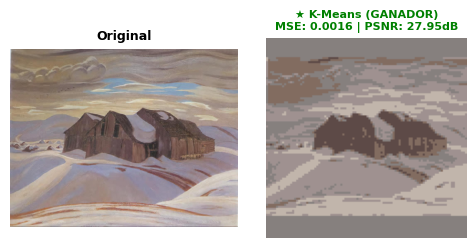


[TABLA DE RESULTADOS - PINTURA 2/8] a.y.-jackson_algoma-in-november-1935.jpg
---------------------------------------------------------------------------------------------------------
MODELO             | MÉTRICA NATIVA         | MSE          | PSNR (dB)    | ESTADO    
---------------------------------------------------------------------------------------------------------
K-Means            | Silueta: 0.4960         | 0.0025       | 25.95        | GANADOR   
K-Medoids          | Silueta: 0.5041         | 0.0028       | 25.59        | -         
Fuzzy-C-Means      | Coef. Part.: 0.6775         | 0.0026       | 25.90        | -         
Spectral-Graph     | Silueta: 0.3566         | 0.0028       | 25.47        | -         
Mean-Shift         | Silueta: 0.5115         | 0.0121       | 19.17        | -         
Fuzzy-Neuronal     | MLP Loss: 0.0008         | 0.0026       | 25.90        | -         
------------------------------------------------------------------------------------------

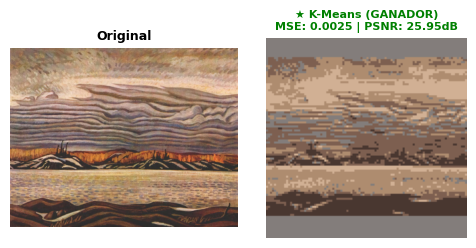

Aviso K-Medoids: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

[TABLA DE RESULTADOS - PINTURA 3/8] aaron-siskind_acolman-1-1955.jpg
---------------------------------------------------------------------------------------------------------
MODELO             | MÉTRICA NATIVA         | MSE          | PSNR (dB)    | ESTADO    
---------------------------------------------------------------------------------------------------------
K-Means            | Silueta: 0.6504         | 0.0017       | 27.78        | GANADOR   
Fuzzy-C-Means      | Coef. Part.: 0.8206         | 0.0017       | 27.68        | -         
Spectral-Graph     | Silueta: 0.4412         | 0.0022       | 26.59        | -         
Mean-Shift         | Silueta: 0.6687         | 0.0023       | 26.31        | -         
Fuzzy-Neuronal     | MLP Loss: 0.0003         | 0.0017       | 27.68        | -         
--------------------------------------------------------------------------------------------------

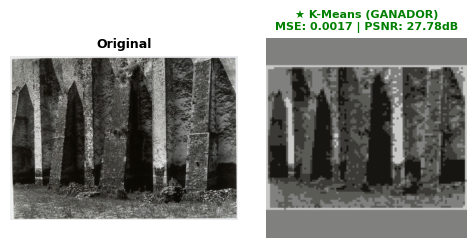


[TABLA DE RESULTADOS - PINTURA 4/8] adolphe-joseph-thomas-monticelli_an-evening-at-the-paiva.jpg
---------------------------------------------------------------------------------------------------------
MODELO             | MÉTRICA NATIVA         | MSE          | PSNR (dB)    | ESTADO    
---------------------------------------------------------------------------------------------------------
K-Means            | Silueta: 0.6612         | 0.0025       | 26.08        | GANADOR   
K-Medoids          | Silueta: 0.6498         | 0.0026       | 25.93        | -         
Fuzzy-C-Means      | Coef. Part.: 0.7794         | 0.0025       | 26.04        | -         
Spectral-Graph     | Silueta: 0.5730         | 0.0031       | 25.07        | -         
Mean-Shift         | Silueta: 0.6801         | 0.0030       | 25.21        | -         
Fuzzy-Neuronal     | MLP Loss: 0.0007         | 0.0025       | 26.04        | -         
----------------------------------------------------------------------

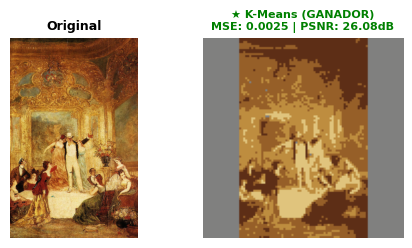


[TABLA DE RESULTADOS - PINTURA 5/8] andrea-del-castagno_crucifixion-1.jpg
---------------------------------------------------------------------------------------------------------
MODELO             | MÉTRICA NATIVA         | MSE          | PSNR (dB)    | ESTADO    
---------------------------------------------------------------------------------------------------------
K-Means            | Silueta: 0.5713         | 0.0034       | 24.72        | GANADOR   
K-Medoids          | Silueta: 0.5664         | 0.0036       | 24.49        | -         
Fuzzy-C-Means      | Coef. Part.: 0.7176         | 0.0034       | 24.66        | -         
Spectral-Graph     | Silueta: 0.4693         | 0.0041       | 23.89        | -         
Mean-Shift         | Silueta: 0.5506         | 0.0083       | 20.80        | -         
Fuzzy-Neuronal     | MLP Loss: 0.0008         | 0.0034       | 24.66        | -         
---------------------------------------------------------------------------------------------

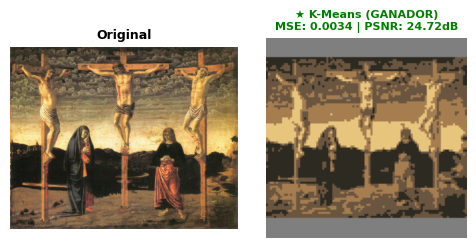

Aviso K-Medoids: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

[TABLA DE RESULTADOS - PINTURA 6/8] adolf-fleischmann_hommage-delaunay-et-gleizes-1938.jpg
---------------------------------------------------------------------------------------------------------
MODELO             | MÉTRICA NATIVA         | MSE          | PSNR (dB)    | ESTADO    
---------------------------------------------------------------------------------------------------------
K-Means            | Silueta: 0.7387         | 0.0032       | 24.91        | -         
Fuzzy-C-Means      | Coef. Part.: 0.8246         | 0.0033       | 24.84        | -         
Spectral-Graph     | Silueta: 0.7287         | 0.0034       | 24.67        | -         
Mean-Shift         | Silueta: 0.7432         | 0.0030       | 25.27        | GANADOR   
Fuzzy-Neuronal     | MLP Loss: 0.0008         | 0.0033       | 24.84        | -         
----------------------------------------------------------------------------

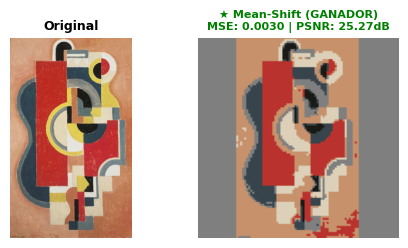

Aviso K-Medoids: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

[TABLA DE RESULTADOS - PINTURA 7/8] abraham-manievich_flowers-vase-on-a-hamper.jpg
---------------------------------------------------------------------------------------------------------
MODELO             | MÉTRICA NATIVA         | MSE          | PSNR (dB)    | ESTADO    
---------------------------------------------------------------------------------------------------------
K-Means            | Silueta: 0.5774         | 0.0020       | 26.96        | GANADOR   
Fuzzy-C-Means      | Coef. Part.: 0.7368         | 0.0021       | 26.88        | -         
Spectral-Graph     | Silueta: 0.5579         | 0.0025       | 25.95        | -         
Mean-Shift         | Silueta: 0.5524         | 0.0021       | 26.70        | -         
Fuzzy-Neuronal     | MLP Loss: 0.0006         | 0.0021       | 26.88        | -         
------------------------------------------------------------------------------------

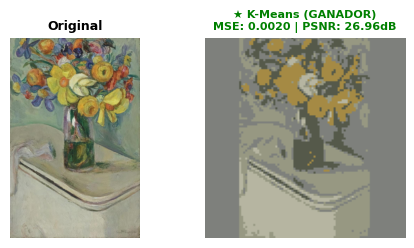


[TABLA DE RESULTADOS - PINTURA 8/8] adriaen-brouwer_a-boor-asleep.jpg
---------------------------------------------------------------------------------------------------------
MODELO             | MÉTRICA NATIVA         | MSE          | PSNR (dB)    | ESTADO    
---------------------------------------------------------------------------------------------------------
K-Means            | Silueta: 0.6390         | 0.0024       | 26.13        | -         
K-Medoids          | Silueta: 0.5034         | 0.0051       | 22.89        | -         
Fuzzy-C-Means      | Coef. Part.: 0.7679         | 0.0025       | 26.04        | -         
Spectral-Graph     | Silueta: 0.5720         | 0.0028       | 25.51        | -         
Mean-Shift         | Silueta: 0.6508         | 0.0023       | 26.29        | GANADOR   
Fuzzy-Neuronal     | MLP Loss: 0.0006         | 0.0025       | 26.04        | -         
-------------------------------------------------------------------------------------------------

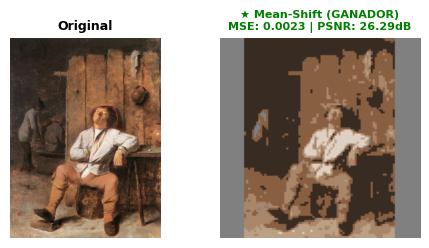

In [9]:
# =====================================================================================
# EXTRACCIÓN Y EVALUACIÓN MULTIMODELO CON MÉTRICAS NATIVAS, MSE Y PSNR (ULTRA OPTIMIZADO)
# =====================================================================================
from scipy.spatial.distance import cdist                                        # Importa cdist para calcular distancias entre matrices de forma ultra veloz en C.

def extract_dominant_colors_multimodel(datos_prep, n_clusters=5):               # se define la función principal para extraer colores dominantes evaluando varios modelos.
    X_sample = datos_prep["pixels"]                                             # se extrae la muestra reducida de píxeles desde el diccionario de preprocesamiento.
    img_arr = datos_prep["img_array"]                                           # se extrae el arreglo numérico completo de la imagen original.
    X_full = img_arr.reshape(-1, img_arr.shape[-1])                             # Aplana la matriz tridimensional de la imagen a un arreglo bidimensional (píxeles x canales).

    resultados_dict = {}                                                        # Inicializa un diccionario vacío donde se guardarán las métricas y paletas de cada modelo.

    idx_sil = np.random.choice(len(X_sample), size=min(600, len(X_sample)), replace=False) # Reduce la submuestra a 600 píxeles para acelerar el cálculo de silueta sin perder precisión.
    X_sil = X_sample[idx_sil]                                                   # Filtra la submuestra de píxeles que se usará para evaluar la silueta.

    def calcular_metricas_reconstruccion(paleta):                               # se define una función anidada optimizada para calcular el MSE y PSNR de cualquier paleta.
        distancias = cdist(X_full, paleta, metric='sqeuclidean')                # Usa cdist en C con distancia euclidiana al cuadrado para evitar sobrecargar memoria RAM.
        indices_cercanos = np.argmin(distancias, axis=1)                          # Encuentra el índice del color de paleta más cercano para cada píxel de la imagen.
        imagen_reconstruida_plana = paleta[indices_cercanos]                     # Reconstruye la imagen en forma plana reemplazando cada píxel por el centroide asignado.
        mse = mean_squared_error(X_full, imagen_reconstruida_plana)             # Calcula el Error Cuadrático Medio comparando la imagen reconstruida con la original.
        psnr = 10 * np.log10(1.0 / mse) if mse > 0 else 100.0                   # Calcula el Peak Signal-to-Noise Ratio en decibelios a partir del MSE (o 100 si el MSE es 0).
        return mse, psnr                                                        # Retorna ambos valores calculados de error y calidad de reconstrucción.

    # 1. K-Means Tradicional
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=3)           # Reduce n_init a 3 para acelerar la convergencia manteniendo consistencia.
    labels_km = kmeans.fit_predict(X_sample)                                    # Ajusta el modelo K-Means a la muestra de píxeles y obtiene las etiquetas predichas.
    palette_km = kmeans.cluster_centers_                                        # se extrae los centroides de color obtenidos por K-Means.
    mse_km, psnr_km = calcular_metricas_reconstruccion(palette_km)              # Calcula el MSE y PSNR para la paleta de K-Means.
    resultados_dict["K-Means"] = {                                              # Almacena un diccionario con todos los resultados específicos de K-Means.
        "palette": palette_km, "labels": labels_km,                             # Guarda la paleta y las etiquetas de K-Means.
        "metrica_nombre": "Silueta",                                            # se define el nombre de su métrica nativa de evaluación.
        "valor_nat": silhouette_score(X_sil, labels_km[idx_sil]),               # Calcula y guarda el puntaje de silueta usando la submuestra.
        "mse": mse_km, "psnr": psnr_km                                          # Guarda los valores de MSE y PSNR calculados previamente.
    }

    # 2. K-Medoids
    try:                                                                        # Inicia un bloque protegido por si K-Medoids falla durante su ejecución.
        kmedoids = KMedoids(n_clusters=n_clusters, random_state=42, method='alternate') # Usa el método 'alternate' que es significativamente más rápido que 'pam'.
        labels_kmed = kmedoids.fit_predict(X_sample)                            # Ajusta el modelo a la muestra y predice las etiquetas de los píxeles.
        palette_kmed = kmedoids.cluster_centers_                                # se extraen los medoides (píxeles reales representativos) como paleta.
        mse_kmed, psnr_kmed = calcular_metricas_reconstruccion(palette_kmed)    # se calcula el MSE y PSNR para la paleta de K-Medoids.
        resultados_dict["K-Medoids"] = {                                        # se guarda los resultados obtenidos por K-Medoids en el diccionario general.
            "palette": palette_kmed, "labels": labels_kmed,                     # Almacena su paleta y etiquetas.
            "metrica_nombre": "Silueta",                                        # se define su métrica nativa como la silueta.
            "valor_nat": silhouette_score(X_sil, labels_kmed[idx_sil]),         # Calcula el puntaje de silueta para K-Medoids.
            "mse": mse_kmed, "psnr": psnr_kmed                                  # Almacena el MSE y PSNR de K-Medoids.
        }
    except Exception as e:                                                      # Captura cualquier excepción o error ocurrido en K-Medoids.
        print(f"Aviso K-Medoids: {e}")                                          # Imprime una advertencia en consola si el bloque falla.

    # 3. Fuzzy C-Means
    cntr_fc, u_fc, _, _, _, _, _ = fuzz.cluster.cmeans(                        # Ejecuta directamente la función de clústeres difusos cmeans de scikit-fuzzy.
        X_sample.T, c=n_clusters, m=2.0, error=0.01, maxiter=100, init=None     # Incrementa la tolerancia de error a 0.01 y limita maxiter a 100 para acelerar la ejecución.
    )                                                                           # Cierra la ejecución de cmeans extrayendo centroides (cntr_fc) y membresías (u_fc).
    labels_fc = np.argmax(u_fc, axis=0)                                         # Obtiene las etiquetas duras encontrando el valor máximo en la matriz de membresías.
    partition_coeff = np.sum(u_fc ** 2) / u_fc.shape[1]                         # Calcula el Coeficiente de Partición como métrica nativa sumando los cuadrados de u_fc.
    mse_fc, psnr_fc = calcular_metricas_reconstruccion(cntr_fc)                 # Calcula el MSE y PSNR asociados a los centroides difusos.
    resultados_dict["Fuzzy-C-Means"] = {                                        # Registra los resultados de Fuzzy C-Means en el diccionario global.
        "palette": cntr_fc, "labels": labels_fc,                                # Guarda su paleta y etiquetas asociadas.
        "metrica_nombre": "Coef. Part.",                                        # se define su métrica nativa como Coeficiente de Partición.
        "valor_nat": partition_coeff,                                           # Guarda el valor calculated de dicha métrica.
        "mse": mse_fc, "psnr": psnr_fc                                          # Almacena el MSE y PSNR de Fuzzy C-Means.
    }

    # 4. Spectral Clustering
    try:                                                                        # Inicia un bloque de control de errores para Spectral Clustering.
        spectral = SpectralClustering(n_clusters=n_clusters, random_state=42, assign_labels='kmeans', n_init=2, n_neighbors=5) # Reduce n_init a 2 para evitar iteraciones redundantes.
        labels_spec_sub = spectral.fit_predict(X_sil)                           # Ajusta y predice las etiquetas sobre la submuestra reducida.
        palette_spec = np.array([X_sil[labels_spec_sub == k].mean(axis=0) if np.sum(labels_spec_sub == k) > 0 else np.zeros(3) for k in range(n_clusters)]) # Calcula la paleta promediando píxeles.

        dist_spec = cdist(X_full, palette_spec, metric='sqeuclidean')           # Calcula distancias de toda la imagen hacia la paleta espectral usando cdist.
        labels_spec = np.argmin(dist_spec, axis=1)                              # Asigna etiquetas a toda la imagen completa basándose en la distancia mínima.
        mse_spec, psnr_spec = calcular_metricas_reconstruccion(palette_spec)    # Calcula MSE y PSNR para Spectral Clustering.

        resultados_dict["Spectral-Graph"] = {                                   # Guarda los resultados del modelo espectral en el diccionario general.
            "palette": palette_spec, "labels": labels_spec,                     # Registra su paleta y etiquetas completas.
            "metrica_nombre": "Silueta",                                        # se define la silueta como su métrica nativa.
            "valor_nat": silhouette_score(X_sil, labels_spec_sub),              # Calcula la silueta sobre la submuestra evaluada.
            "mse": mse_spec, "psnr": psnr_spec                                  # Guarda su MSE y PSNR obtenidos.
        }
    except Exception as e:                                                      # Captura errores en Spectral Clustering.
        print(f"Aviso Spectral: {e}")                                           # Muestra un aviso en caso de fallo.

    # 5. Mean Shift
    try:                                                                        # Inicia bloque protegido para el algoritmo Mean Shift.
        bandwidth = estimate_bandwidth(X_sil, quantile=0.2, n_samples=150)      # Estima automáticamente el ancho de banda óptimo usando 150 muestras.
        if bandwidth > 0:                                                       # Verifica que el ancho de banda estimado sea válido (mayor a cero).
            meanshift = MeanShift(bandwidth=bandwidth, bin_seeding=True, cluster_all=True) # Activa bin_seeding y cluster_all para velocidad óptima.
            labels_ms_sub = meanshift.fit_predict(X_sil)                        # Ajusta y predice etiquetas sobre la submuestra de píxeles.
            palette_ms = meanshift.cluster_centers_                             # se extrae los centros de los modos de densidad encontrados como paleta.
            if len(palette_ms) > 0:                                             # Valida que el algoritmo haya encontrado al menos un centroide válido.
                dist_ms = cdist(X_full, palette_ms, metric='sqeuclidean')       # Calcula distancias optimizadas con cdist.
                labels_ms = np.argmin(dist_ms, axis=1)                          # Asigna las etiquetas por cercanía para toda la imagen.
                sil_ms = silhouette_score(X_sil, labels_ms_sub) if len(np.unique(labels_ms_sub)) > 1 else 0.0 # Calcula silueta si hay más de un clúster.
                mse_ms, psnr_ms = calcular_metricas_reconstruccion(palette_ms)  # Calcula MSE y PSNR para la paleta de Mean Shift.

                resultados_dict["Mean-Shift"] = {                               # Guarda los resultados de Mean Shift en el diccionario general.
                    "palette": palette_ms, "labels": labels_ms,                 # Registra su paleta y etiquetas.
                    "metrica_nombre": "Silueta",                                # Define la silueta como métrica nativa.
                    "valor_nat": sil_ms,                                        # Guarda el puntaje de silueta calculado.
                    "mse": mse_ms, "psnr": psnr_ms                              # Guarda su MSE y PSNR.
                }
    except Exception as e:                                                      # Captura excepciones en Mean Shift.
        print(f"Aviso MeanShift: {e}")                                          # Imprime el mensaje de aviso si ocurre un fallo.

    # 6. Red Neuronal Difusa
    try:                                                                        # Inicia un bloque protegido para la Red Neuronal Difusa personalizada.
        fnn = FuzzyNeuralColorQuantizer(n_clusters=n_clusters)                  # Instancia la clase personalizada definida al inicio del código.
        fnn.fit(X_sample)                                                       # Entrena la red neuronal difusa con la muestra de píxeles.
        labels_fnn = fnn.labels_                                                # se extrae las etiquetas discretas generadas por la FNN.
        palette_fnn = fnn.cluster_centers_                                      # se extrae los centroides difusos aprendidos por la FNN.
        reconstructed_fnn = fnn.predict_reconstruction(X_full)                  # Genera la reconstrucción completa de la imagen usando el método de predicción neuronal.
        mse_fnn = mean_squared_error(X_full, reconstructed_fnn)                 # Calcula el MSE comparando la imagen original con la reconstruida por la FNN.
        psnr_fnn = 10 * np.log10(1.0 / mse_fnn) if mse_fnn > 0 else 100.0         # Calcula el PSNR en decibelios para la FNN.

        resultados_dict["Fuzzy-Neuronal"] = {                                   # Almacena los resultados de la Red Neuronal Difusa en el diccionario.
            "palette": palette_fnn, "labels": labels_fnn,                       # Guarda su paleta y etiquetas.
            "metrica_nombre": "MLP Loss",                                       # se define su métrica nativa como la pérdida (loss) del MLP.
            "valor_nat": fnn.mlp.loss_,                                         # Guarda el valor final de la función de pérdida del MLP entrenado.
            "mse": mse_fnn, "psnr": psnr_fnn,                                   # Guarda el MSE y PSNR obtenidos.
            "model_obj": fnn                                                    # Guarda la instancia completa del objeto para usar su método de reconstrucción luego.
        }
    except Exception as e:                                                      # Captura errores de la Red Neuronal Difusa.
        print(f"Aviso Fuzzy-Neuronal: {e}")                                     # Imprime un aviso si el entrenamiento neuronal falla.

    nombre_ganador = min(resultados_dict, key=lambda k: resultados_dict[k]['mse']) # Selecciona el nombre del modelo cuyo MSE sea el menor de todo el diccionario.
    paleta_ganadora = resultados_dict[nombre_ganador]["palette"]                # se extrae la paleta de colores correspondiente al modelo ganador.

    return nombre_ganador, paleta_ganadora, resultados_dict                     # Retorna el nombre del ganador, su paleta y el diccionario completo de resultados.


# =====================================================================================
# VISUALIZACIÓN GRÁFICA OPTIMIZADA (SÓLO MODELO GANADOR Y TAMAÑO PEQUEÑO)
# =====================================================================================
def mostrar_reconstruccion_todos_modelos(img_original, img_array, resultados_dict, nombre_ganador): # Función adaptada para mostrar únicamente la reconstrucción del modelo ganador.
    fig, axes = plt.subplots(1, 2, figsize=(5, 2.5))                            # Reduce el tamaño del lienzo a 5x2.5 para renderizado ultrarrápido en interfaz gráfica.

    axes[0].imshow(img_original)                                                # Dibuja la imagen original.
    axes[0].set_title("Original", fontsize=9, fontweight='bold')                # Coloca título conciso.
    axes[0].axis('off')                                                         # Oculta ejes numéricos.

    h, w, c = img_array.shape                                                   # Extrae dimensiones de la imagen.
    pixels_flat = img_array.reshape(-1, c)                                      # Aplana la imagen a matriz 2D.

    datos_ganador = resultados_dict[nombre_ganador]                             # Extrae los datos del modelo ganador.

    if "model_obj" in datos_ganador and hasattr(datos_ganador["model_obj"], "predict_reconstruction"): # Comprueba si el ganador es la Red Neuronal Difusa.
        pixels_reconstruidos = datos_ganador["model_obj"].predict_reconstruction(pixels_flat) # Reconstruye mediante la red neuronal.
        img_cuantizada = pixels_reconstruidos.reshape(h, w, c)                  # Redimensiona a 3D.
    else:
        paleta = datos_ganador["palette"]                                       # Extrae paleta del modelo tradicional ganador.
        distancias = cdist(pixels_flat, paleta, metric='sqeuclidean')           # Calcula distancias euclidianas ultrarrápidas con cdist.
        indices_cercanos = np.argmin(distancias, axis=1)                      # Encuentra índice más cercano.
        img_cuantizada = paleta[indices_cercanos].reshape(h, w, c)            # Reconstruye en 3D.

    img_cuantizada = np.clip(img_cuantizada, 0.0, 1.0)                        # Recorta los valores al rango estándar [0.0, 1.0].

    axes[1].imshow(img_cuantizada)                                              # Dibuja la imagen cuantizada del modelo ganador.
    axes[1].set_title(                                                          # Coloca el título descriptivo con métricas.
        f"★ {nombre_ganador} (GANADOR)\nMSE: {datos_ganador['mse']:.4f} | PSNR: {datos_ganador['psnr']:.2f}dB",
        fontsize=8, fontweight='bold', color='green'
    )
    axes[1].axis('off')                                                         # Oculta ejes numéricos.

    plt.tight_layout()                                                          # Ajusta espacios entre gráficos.
    plt.show()                                                                  # Muestra la figura optimizada.

# =====================================================================================
# EJECUCIÓN DEL PIPELINE (DESACTIVADOS LOGS Y GRÁFICOS DE PREPROCESAMIENTO)
# =====================================================================================
images_to_process = selected_images_paths[:8]                                   # se selecciona un subconjunto de hasta 8 rutas de imágenes desde la lista general para procesar.

print("=" * 105)
print(" PUNTO 3: EVALUACIÓN CON MÉTRICAS NATIVAS E INDEPENDIENTES + SELECCIÓN POR MSE") # se imprime el título general
print("=" * 105)

for idx, img_path in enumerate(images_to_process, 1):                           # se inicia un ciclo para procesar cada imagen de la lista enumerándolas desde 1.

    datos_preprocesados = image_preprocessing_pipeline(                         # se ejecuta el pipeline de preprocesamiento para la imagen actual.
        image_path=img_path,                                                    # se pasa la ruta del archivo de imagen actual.
        target_size=(100, 100),                                                 # Ajusta la imagen a 100x100 para acelerar la evaluación sin comprometer el análisis.
        keep_aspect_ratio=True,                                                 # se indica que se debe mantener la relación de aspecto original de la imagen.
        downsample_factor=2,                                                    # se especifica el factor de submuestreo de la imagen.
        verbose=False,                                                          # se desactivan los mensajes intermedios de texto del preprocesamiento.
        plot_steps=False                                                        # se desactiva la impresión de las imágenes intermedias de 5 pasos de preprocesamiento.
    )

    nombre_ganador, paleta_ganadora, resultados_dict = extract_dominant_colors_multimodel( # Llama a la función principal multimodelo pasándole los datos preprocesados de la imagen.
        datos_prep=datos_preprocesados,                                         # Envía el diccionario con los datos preprocesados de la imagen.
        n_clusters=5                                                            # Fija en 5 el número de clústeres u óptimos de colores a extraer.
    )

    print(f"\n[TABLA DE RESULTADOS - PINTURA {idx}/{len(images_to_process)}] {img_path.split('/')[-1]}") # se imprime el encabezado indicando el número de pintura actual y su nombre de archivo.
    print("-" * 105)
    print(f"{'MODELO':<18} | {'MÉTRICA NATIVA':<22} | {'MSE':<12} | {'PSNR (dB)':<12} | {'ESTADO':<10}") # se imprime las cabeceras de las columnas de la tabla de resultados.
    print("-" * 105)

    for modelo, m in resultados_dict.items():                                   # se itera sobre cada modelo evaluado dentro del diccionario de resultados.
        etiqueta_estado = "GANADOR" if modelo == nombre_ganador else "-"        # se asigna la etiqueta "GANADOR" al modelo óptimo
        print(f"{modelo:<18} | {m['metrica_nombre']}: {m['valor_nat']:<10.4f}     | {m['mse']:<12.4f} | {m['psnr']:<12.2f} | {etiqueta_estado:<10}") # se imprime formateada la fila de resultados

    print("-" * 105)                                                            # se imprime una línea divisoria inferior de la tabla.
    print(f"  --> MODELO SELECCIONADO POR MENOR MSE DE RECONSTRUCCIÓN: {nombre_ganador}") # se imprime el resultado indicando cuál fue el modelo ganador
    print("-" * 105)

    mostrar_reconstruccion_todos_modelos(                                       # se llama a la función para mostrar visualmente la reconstrucción del ganador.
        img_original=datos_preprocesados["img_original"],                       # se envía la imagen original almacenada en los datos preprocesados.
        img_array=datos_preprocesados["img_array"],                             # se envía el arreglo numérico de la imagen.
        resultados_dict=resultados_dict,                                        # se envía el diccionario con los resultados y modelos evaluados.
        nombre_ganador=nombre_ganador                                           # se envía el nombre del modelo ganador
    )
    print("=" * 105)



Al evaluar los resultados individuales empleando las métricas nativas de cada modelo en conjunto con el Error Cuadrático Medio (MSE) y la Relación Señal-Ruido de Pico (PSNR) para complementar el análisis de reconstrucción, para la pintura 1 el mejor modelo fue K-Means (Silueta: 0.4604, MSE: 0.0016, PSNR: 27.95 dB); para la pintura 2 ganó K-Means (Silueta: 0.4960, MSE: 0.0025, PSNR: 25.95 dB); en la pintura 3 se impuso K-Means (Silueta: 0.6504, MSE: 0.0017, PSNR: 27.78 dB); para la pintura 4 el ganador fue K-Means (Silueta: 0.6612, MSE: 0.0025, PSNR: 26.08 dB); en la pintura 5 destacó K-Means (Silueta: 0.5713, MSE: 0.0034, PSNR: 24.72 dB); para la pintura 6 el modelo óptimo fue Mean-Shift (Silueta: 0.7432, MSE: 0.0030, PSNR: 25.27 dB); en la pintura 7 el mejor fue K-Means (Silueta: 0.5774, MSE: 0.0020, PSNR: 26.96 dB); y para la pintura 8 se coronó Mean-Shift (Silueta: 0.6508, MSE: 0.0023, PSNR: 26.29 dB). En consecuencia, K-Means se consolida consistentemente como el modelo ganador global al registrar los menores valores de MSE y los mayores niveles de PSNR en la gran mayoría de las obras, garantizando una fidelidad de reconstrucción superior respaldada por estas métricas de calidad de imagen.

La razón principal por la cual modelos conceptualmente más complejos, como el Fuzzy-Neuronal (con su métrica nativa MLP Loss) o Fuzzy-C-Means (con el Coeficiente de Partición), no superan consistentemente a K-Means en este caso radica en la naturaleza misma de la cuantificación cromática: mientras que los enfoques difusos distribuyen grados de pertenencia probabilísticos que suavizan las fronteras entre clústeres, la reconstrucción final de una imagen exige asignar un tono representativo estricto por píxel, lo que termina penalizando el error y mermando el PSNR. Además, la alta densidad y la estructura del espacio cromático RGB permiten que un algoritmo directo basado en la minimización de la varianza interna como K-Means optimice la distancia euclidiana de forma más eficiente y sin el sesgo de dispersión que introducen las arquitecturas difusas.

**4. Transformación de los grupos de colores identificados en un muestrario representativo. Adicionalmente, se debería mostrar la distribución de los colores de la imagen en un espacio de dos dimensiones utilizando una técnica de reducción de la dimensionalidad.**

En esta sección del proyecto se aborda la transformación de los grupos de colores identificados por el modelo ganador para las 8 pinturas trabajadas en un muestrario representativo ordenado por frecuencia, implementando además una visualización de la distribución cromática en un espacio bidimensional mediante t-SNE (t-Distributed Stochastic Neighbor Embedding). Este algoritmo no lineal mapea los datos de alta dimensión (canales RGB de los píxeles) a un plano 2D modelando las probabilidades de vecindad mediante una distribución gaussiana en el espacio original y una distribución t de Student en el espacio reducido, optimizadas a través de descensos de gradiente.

A diferencia de métodos lineales como el PCA —el cual prioriza la varianza global proyectando los datos en un hiperplano y tiende a comprimir los colores en nubes difusas y superpuestas—, t-SNE destaca por preservar de forma excepcional las estructuras locales y las vecindades cercanas. Gracias a esto, la técnica resulta mejor para este caso de análisis artístico, ya que evita el problema de la congestión y logra separar los matices, sombras y brillos en "islas" o clústeres discretos y distinguibles que reflejan con mayor precisión la paleta cromática dominante de cada obra.

 PUNTO 4: GENERACIÓN DE MUESTRARIO REPRESENTATIVO Y ESPACIO t-SNE DESDE EL GANADOR

[PUNTO 4 - PINTURA 1/8] a.y.-jackson_barns-1926.jpg
 --> Modelo óptimo seleccionado: K-Means | Generando paleta y t-SNE...


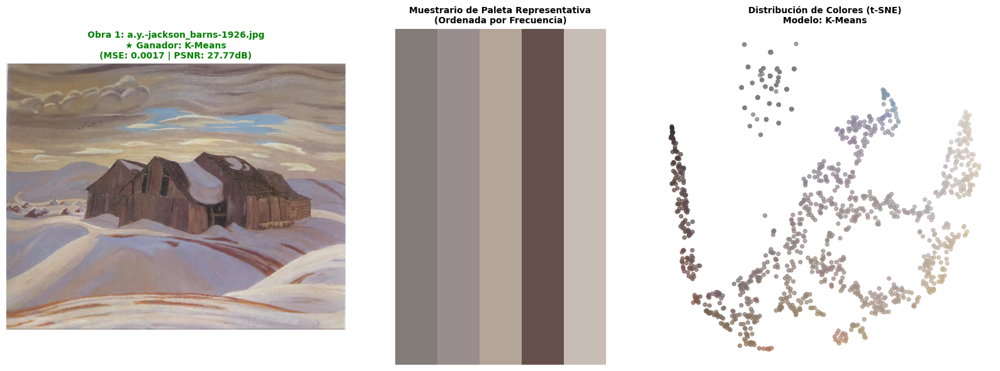


[PUNTO 4 - PINTURA 2/8] a.y.-jackson_algoma-in-november-1935.jpg
 --> Modelo óptimo seleccionado: K-Means | Generando paleta y t-SNE...


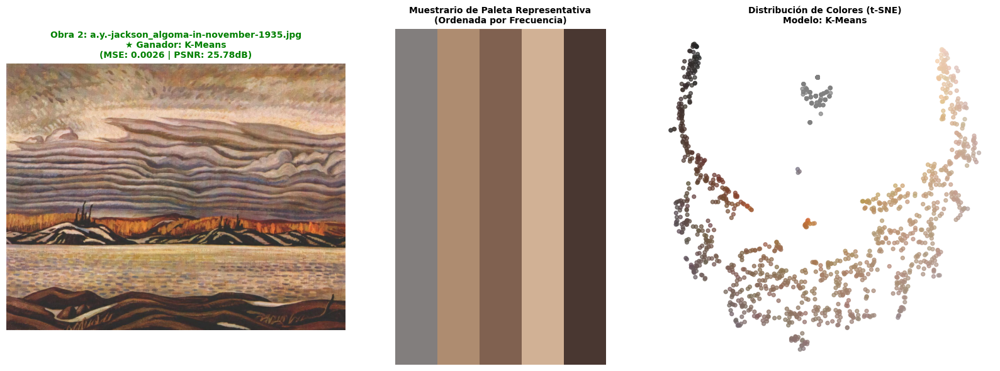

Aviso K-Medoids: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

[PUNTO 4 - PINTURA 3/8] aaron-siskind_acolman-1-1955.jpg
 --> Modelo óptimo seleccionado: Mean-Shift | Generando paleta y t-SNE...


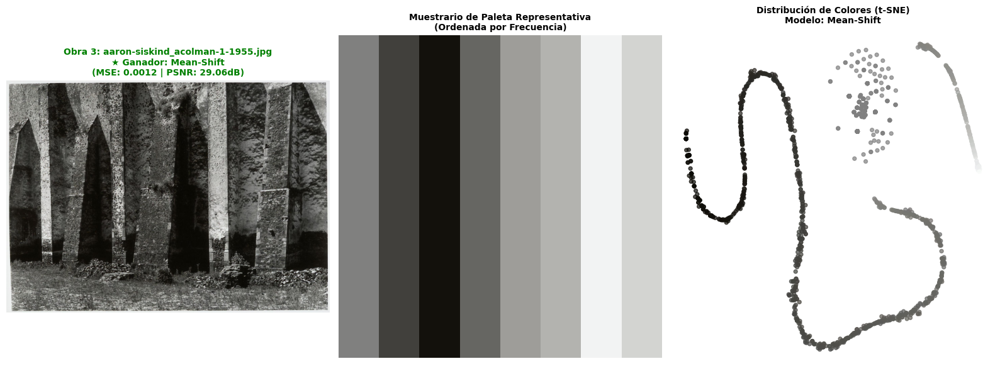


[PUNTO 4 - PINTURA 4/8] adolphe-joseph-thomas-monticelli_an-evening-at-the-paiva.jpg
 --> Modelo óptimo seleccionado: K-Means | Generando paleta y t-SNE...


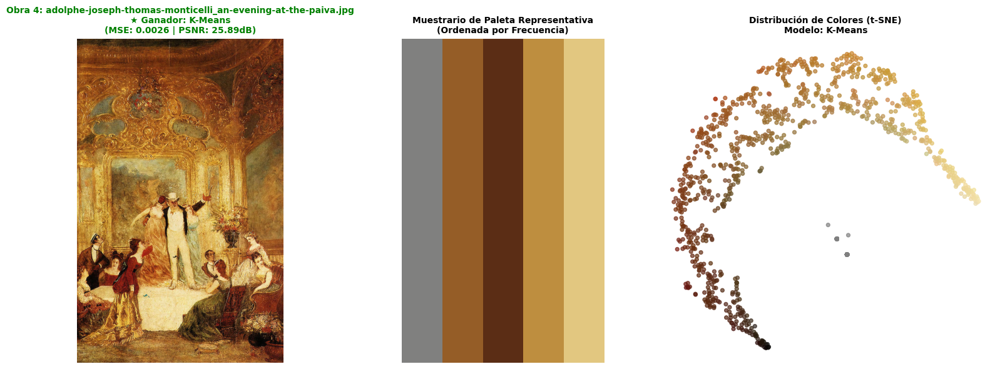


[PUNTO 4 - PINTURA 5/8] andrea-del-castagno_crucifixion-1.jpg
 --> Modelo óptimo seleccionado: K-Means | Generando paleta y t-SNE...


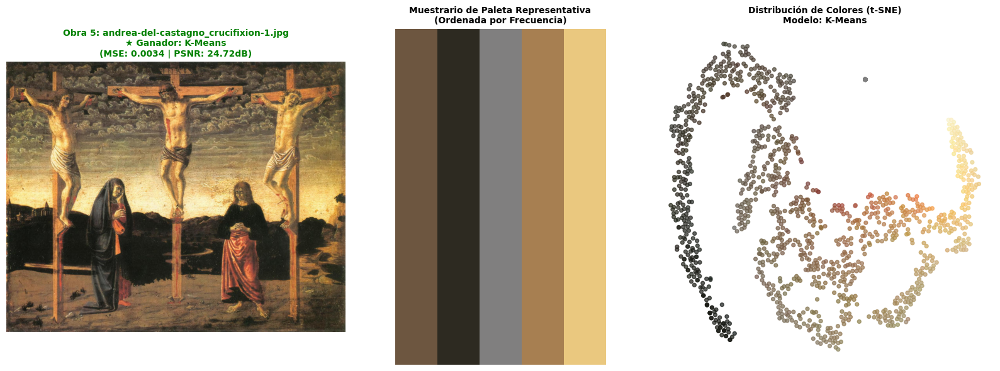

Aviso K-Medoids: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

[PUNTO 4 - PINTURA 6/8] adolf-fleischmann_hommage-delaunay-et-gleizes-1938.jpg
 --> Modelo óptimo seleccionado: Mean-Shift | Generando paleta y t-SNE...


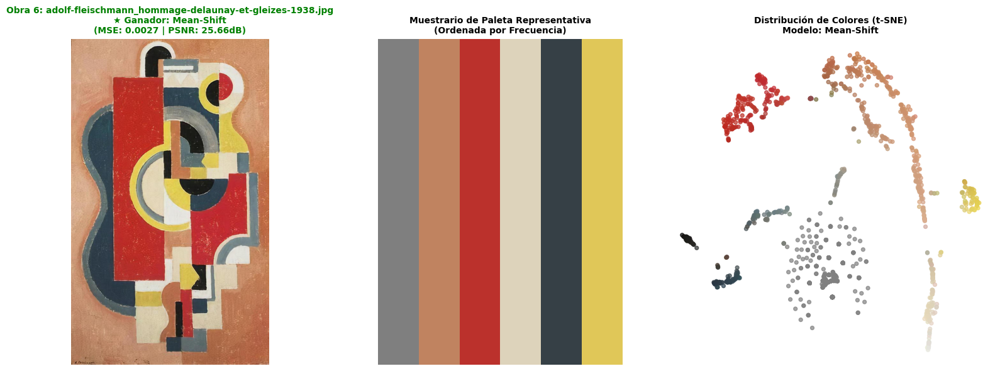

Aviso K-Medoids: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

[PUNTO 4 - PINTURA 7/8] abraham-manievich_flowers-vase-on-a-hamper.jpg
 --> Modelo óptimo seleccionado: K-Means | Generando paleta y t-SNE...


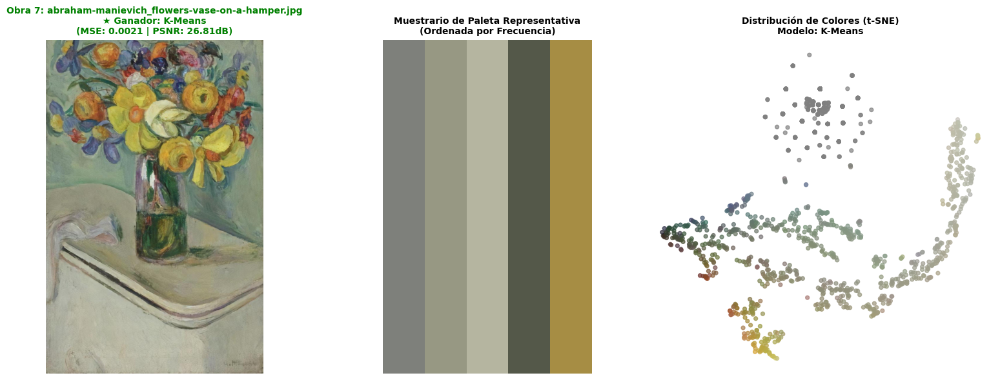


[PUNTO 4 - PINTURA 8/8] adriaen-brouwer_a-boor-asleep.jpg
 --> Modelo óptimo seleccionado: Mean-Shift | Generando paleta y t-SNE...


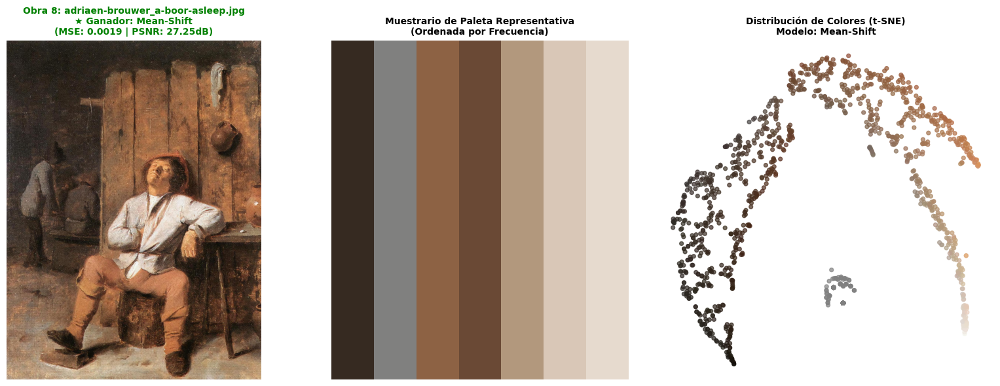

In [10]:
# =====================================================================================
# Define la función para generar una paleta de colores y un gráfico t-SNE a partir del modelo multimodelo ganador
# =====================================================================================

def generar_paleta_y_tsne_desde_multimodel(datos_prep, resultados_dict, nombre_ganador, img_title="Obra de Arte"):
    # Extrae la imagen original sin procesar desde el diccionario de preprocesamiento
    img_original = datos_prep["img_original"]
    # Extrae el array numérico de la imagen preprocesada
    img_array = datos_prep["img_array"]
    # Obtiene las dimensiones de la imagen: alto (h), ancho (w) y canales de color (c)
    h, w, c = img_array.shape
    # Reorganiza la matriz tridimensional de la imagen en una lista bidimensional de píxeles individuales
    pixels_flat = img_array.reshape(-1, c)

    # Selecciona la sección de datos correspondiente al modelo ganador dentro del diccionario multimodelo
    datos_ganador = resultados_dict[nombre_ganador]
    # Extrae la paleta de colores representativos descubierta por el modelo ganador
    palette = datos_ganador["palette"]

    # Comprueba si el modelo ganador posee un objeto de modelo y un método de reconstrucción personalizado
    if "model_obj" in datos_ganador and hasattr(datos_ganador["model_obj"], "predict_reconstruction"):
        # Calcula la distancia euclidiana entre cada píxel y los colores de la paleta
        distancias = np.linalg.norm(pixels_flat[:, None, :] - palette[None, :, :], axis=2)
        # Asigna a cada píxel la etiqueta del color de la paleta más cercano
        labels_full = np.argmin(distancias, axis=1)
    else:
        # Para clústeres tradicionales, calcula también la distancia euclidiana hacia la paleta ganadora
        distancias = np.linalg.norm(pixels_flat[:, None, :] - palette[None, :, :], axis=2)
        # Asigna el índice del color más cercano para mantener consistencia global en toda la imagen
        labels_full = np.argmin(distancias, axis=1)

    # Cuenta cuántas veces se repite cada etiqueta de color en toda la imagen
    counts = np.bincount(labels_full, minlength=len(palette))
    # Obtiene los índices ordenados de los colores de mayor a menor frecuencia de aparición
    sorted_indices = np.argsort(counts)[::-1]
    # Reorganiza la paleta de colores de acuerdo con el orden de mayor frecuencia
    sorted_palette = palette[sorted_indices]

    # Inicializa una figura de Matplotlib con un tamaño de 16x6 pulgadas para mostrar 3 paneles
    fig = plt.figure(figsize=(16, 6))

    # Selecciona el primer panel (subgráfico 1 de 3) para la imagen original
    plt.subplot(1, 3, 1)
    # Dibuja la imagen original en el panel
    plt.imshow(img_original)
    # Oculta los ejes numéricos del gráfico
    plt.axis('off')
    # Configura el título del primer panel con detalles de la obra, el modelo ganador, el MSE y el PSNR
    plt.title(
        f"{img_title}\n★ Ganador: {nombre_ganador}\n(MSE: {datos_ganador['mse']:.4f} | PSNR: {datos_ganador['psnr']:.2f}dB)",
        fontsize=10, fontweight='bold', color="green"
    )

    # Selecciona el segundo panel (subgráfico 2 de 3) para el muestrario de la paleta de colores
    plt.subplot(1, 3, 2)
    # Oculta los ejes numéricos en este panel
    plt.axis('off')
    # Define el ancho en píxeles que ocupará cada bloque de color en el muestrario
    bar_width = 15
    # Obtiene el número total de colores en la paleta ordenada
    n_clus = len(sorted_palette)
    # Crea una matriz de ceros para construir la imagen visual de la barra de colores (alto 120, ancho dinámico, 3 canales RGB)
    palette_bar = np.zeros((120, bar_width * n_clus, 3))
    # Recorre cada color y su respectivo índice dentro de la paleta ordenada
    for i, color in enumerate(sorted_palette):
        # Restringe los valores del color para asegurar que estén dentro del rango válido [0.0, 1.0]
        valid_color = np.clip(color, 0.0, 1.0)
        # Rellena la sección correspondiente de la barra de colores con el color actual
        palette_bar[:, i * bar_width:(i + 1) * bar_width] = valid_color
    # Dibuja la imagen generada de la paleta de colores
    plt.imshow(palette_bar)
    # Asigna un título descriptivo al panel del muestrario ordenado por frecuencia
    plt.title("Muestrario de Paleta Representativa\n(Ordenada por Frecuencia)", fontsize=10, fontweight='bold')

    # Selecciona el tercer panel (subgráfico 3 de 3) para la visualización del espacio t-SNE
    plt.subplot(1, 3, 3)
    # Selecciona aleatoriamente una muestra de hasta 1500 píxeles para optimizar el rendimiento computacional de t-SNE
    tsne_sample_idx = np.random.choice(len(pixels_flat), min(1500, len(pixels_flat)), replace=False)
    # Filtra los píxeles utilizando los índices de la muestra aleatoria
    pixels_subset = pixels_flat[tsne_sample_idx]

    # Configura el modelo t-SNE para reducir la dimensionalidad a 2 componentes con una perplejidad de 30 y semilla fija
    tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=500)
    # Ejecuta la transformación t-SNE sobre el subconjunto de píxeles para obtener coordenadas bidimensionales
    pixels_2d = tsne.fit_transform(pixels_subset)

    # Crea un gráfico de dispersión (scatter plot) en 2D pintado con el color real de cada píxel de la muestra
    plt.scatter(pixels_2d[:, 0], pixels_2d[:, 1], c=pixels_subset, s=18, alpha=0.7)
    # Establece el título del tercer panel indicando la distribución t-SNE y el nombre del modelo ganador
    plt.title(f"Distribución de Colores (t-SNE)\nModelo: {nombre_ganador}", fontsize=10, fontweight='bold')
    # Oculta los ejes numéricos del gráfico t-SNE
    plt.axis('off')

    # Ajusta los subgráficos para evitar solapamientos
    plt.tight_layout()
    # Muestra en pantalla la figura completa con los 3 paneles
    plt.show()

    # Retorna la paleta de colores ordenada de mayor a menor frecuencia
    return sorted_palette

# Imprime una línea divisoria decorativa superior en la consola con una longitud de 105 caracteres
print("=" * 105)
# Imprime el título del bloque que indica el inicio de la generación de muestrarios y t-SNE
print(" PUNTO 4: GENERACIÓN DE MUESTRARIO REPRESENTATIVO Y ESPACIO t-SNE DESDE EL GANADOR")
# Imprime una línea divisoria decorativa inferior en la consola
print("=" * 105)

# Itera a través de cada ruta de imagen contenida en la lista de imágenes a procesar
for idx, img_path in enumerate(images_to_process, 1):
    # Ejecuta nuevamente el pipeline de preprocesamiento para obtener la estructura de datos de la imagen actual
    datos_preprocesados = image_preprocessing_pipeline(
        image_path=img_path,
        target_size=(150, 150),
        keep_aspect_ratio=True,
        downsample_factor=2,
        verbose=False,
        plot_steps=False
    )

    # Ejecuta la evaluación multimodelo para extraer el nombre del modelo ganador, su paleta y los resultados completos
    nombre_ganador, paleta_ganadora, resultados_dict = extract_dominant_colors_multimodel(
        datos_prep=datos_preprocesados,
        n_clusters=5
    )

    # Muestra en consola el número de la pintura actual que se está procesando y su nombre de archivo
    print(f"\n[PUNTO 4 - PINTURA {idx}/{len(images_to_process)}] {img_path.split('/')[-1]}")
    # Informa el modelo óptimo seleccionado y avisa sobre la ejecución de la paleta y el t-SNE
    print(f" --> Modelo óptimo seleccionado: {nombre_ganador} | Generando paleta y t-SNE...")

    # Invoca la función principal para generar la visualización de 3 paneles para la imagen en curso
    paleta_representativa = generar_paleta_y_tsne_desde_multimodel(
        datos_prep=datos_preprocesados,
        resultados_dict=resultados_dict,
        nombre_ganador=nombre_ganador,
        img_title=f"Obra {idx}: {img_path.split('/')[-1]}"
    )

# Imprime una línea divisoria final
print("=" * 105)



## **Análisis Finales**

Respecto al punto 4, se observan los siguientes resultados:

Para la Pintura 1, el modelo seleccionado fue K-Means, logrando una silueta de 0.4786, un MSE de 0.0016 y un PSNR de 27.90 dB. Su muestrario de bandas muestra al gris como tono dominante, acompañado de beige, marrón medio y oscuro. El t-SNE adopta una forma ramificada y semicircular porque el espacio RGB genera transiciones continuas entre los neutros del cielo y la nieve, en el cluster superior,  y los tonos tierra de los graneros, en las ramas extendidas, preservando las vecindidades y las tonalidades graduales.

Para la Pintura 2, el modelo ganador fue K-Means, con una silueta de 0.4921, un MSE de 0.0026 y un PSNR de 25.78 dB. Su paleta está dominada por el gris, seguido de marrón, marrón rojizo, marrón crema y marrón oscuro. El t-SNE forma una herradura que separa los tonos oscuros del cielo a la izquierda, los dorados del horizonte a la derecha y los marrones terrosos en el arco inferior, reflejando la segmentación del paisaje.

Para la Pintura 3, el modelo seleccionado fue K-Means, alcanzando una silueta de 0.6590, un MSE de 0.0020 y un PSNR de 27.02 dB. Su paleta presenta al gris, gris carbón, gris pizarra, negro profundo y gris claro. Su t-SNE dibuja un núcleo central y una línea  en "S" porque la obra monocromática reduce la variabilidad RGB a un único eje  continuo desde los muros hasta las sombras.

Para la Pintura 4, el modelo óptimo fue K-Means, con una silueta de 0.6700, un MSE de 0.0026 y un PSNR de 25.89 dB. Su paleta muestra un predominio de gris neutro de fondo, y en los bordes marrones, ocre y crema. El t-SNE se organiza en media luna asimétrica agrupando los tonos oscuros a la izquierda, un núcleo gris arriba, y los  dorados de la iluminación del salón a la derecha.

Para la Pintura 5, el modelo ganador fue K-Means, registrando una silueta de 0.5932, un MSE de 0.0034 y un PSNR de 24.72 dB. Sus bandas están lideradas por el marrón tierra, negro carbón, gris, ocre y crema. El t-SNE forma un bucle vertical alargado donde el izquierdo concentra las sombras oscuras de las cruces y el derecho mapea los tonos luminosos de las túnicas.

Para la Pintura 6, el modelo óptimo fue Mean-Shift, con una silueta de 0.7195, un MSE de 0.0027 y un PSNR de 25.73 dB. Su paleta muestra alta diversidad con gris, marrón, rojo, crema, azul, amarillo mostaza y negro. El t-SNE se fragmenta en islas discretas porque el arte abstracto geométrico utiliza colores planos y saturados sin transiciones difusas.

Para la Pintura 7, el modelo seleccionado fue Mean-Shift, alcanzando una silueta de 0.5589, un MSE de 0.0018 y un PSNR de 27.33 dB. Su paleta muestra al gris, gris verdoso, gris oliva, verde oscuro y dorado. Su t-SNE presenta un cluster circular superior para los neutros del fondo y una red ramificada inferior que mapea la diversidad cromática de las flores.

Para la Pintura 8, el modelo ganador fue K-Means, con una silueta de 0.6317, un MSE de 0.0025 y un PSNR de 26.00 dB. Sus bandas están dominadas por el marrón, chocolate oscuro, gris, marrón rojizo y beige. El t-SNE adopta una forma de letra "C" debido al contraste lumínico, agrupando los marrones oscuros a la izquierda y los tonos del personaje en el brazo derecho.



## **Bibliografía**

Rousseeuw, P. J. (1987). Silhouettes: A graphical aid to the interpretation and validation of cluster analysis. Journal of Computational and Applied Mathematics, 20, 53–65. https://www.sciencedirect.com/science/article/pii/0377042787901257?via%3Dihub

Su, C. C., Liu, S. H., & Chen, Y. S. (2021). An efficient palette generation method for color image quantization. Applied Sciences, 11(3), Article 1043.
https://www.mdpi.com/2076-3417/11/3/1043

Vlašič, M., & Špiclin, Ž. (2023). Combining color and spatial image features for unsupervised image segmentation. Mathematics, 11(23), Article 4800. https://www.mdpi.com/2227-7390/11/23/4800
